# Insurance Claim Fraud Detection

## Project Description

<B>Independent Variables<B>
1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported


### Target

 you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 


### Importing Libraries

In [1]:
import warnings
warnings.simplefilter("ignore")
import missingno as ms   #for missing values visualization
import joblib

import pandas as pd
import numpy as np
import seaborn as sns    #for creating heatmap, time series plot, violin plots &so on
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import zscore

import scipy
import sklearn
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
import xgboost as xgb
import lightgbm as lgb

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

pd.set_option('display.max_columns', None)
import datetime as dt

##### Importing Dataset

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


We can see that the total number of rows are 1000 and columns are 40 in our dataframe. We see a mixture of numerical data columns and text data columns that will need to be converted to numerical format before training our model.

In our problem statement we are asked to predict the fraud_reported as our label using the remaining columns as our features making this to be a **Classification problem!**

In [3]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
df.shape

(1000, 40)

There are 1000 rows and 40 colums

# Exploratory Data Analysis(EDA)

In [6]:
df.columns.tolist()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported',
 '_c39']

### Checking out all the column details that were truncated before and analyzing if we can drop any useless information column(s)

In [7]:
df.nunique().to_frame("Unique Values")

,Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


Using the nunique method we are able to list down all the unique values present in our dataset columns.

In the above cell we can see that the column "c39" is only filled null values and can be dropped.

And there are 2 columns which have all the 1000 rows filled with unique data that will need to be removed as it won't help in our label prediction anyway.

In [8]:
df.drop(["policy_number", "incident_location", "_c39"], axis=1, inplace=True)

I am dropping the column "_c39", "policy_number" and "incident_location" columns since I feel it is pretty much useless showing just a list of unique identifiers on each row without adding much insight into the prediction of our target label.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_bind_date             1000 non-null   object 
 3   policy_state                 1000 non-null   object 
 4   policy_csl                   1000 non-null   object 
 5   policy_deductable            1000 non-null   int64  
 6   policy_annual_premium        1000 non-null   float64
 7   umbrella_limit               1000 non-null   int64  
 8   insured_zip                  1000 non-null   int64  
 9   insured_sex                  1000 non-null   object 
 10  insured_education_level      1000 non-null   object 
 11  insured_occupation           1000 non-null   object 
 12  insured_hobbies              1000 non-null   object 
 13  insured_relationshi

Using the info method we can see that there is 1 column with float data type, 16 columns with integer data type and 20 columns that have object data type. We will try to spearate these columns into numeric and object datatypes for easier analysis.

there is no null columns present in the dataset. also its clear about datatypes

and We will convert this object type data into numerical using encoding techniquies before building the model.

## checking null values

In [10]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

- There is no missing values present in the dataset and data is cleaned.

### % of Null value present in the dataset

In [11]:
n=(df.isnull().sum()/(len(df)))*100
np.round(n,2)

months_as_customer             0.0
age                            0.0
policy_bind_date               0.0
policy_state                   0.0
policy_csl                     0.0
policy_deductable              0.0
policy_annual_premium          0.0
umbrella_limit                 0.0
insured_zip                    0.0
insured_sex                    0.0
insured_education_level        0.0
insured_occupation             0.0
insured_hobbies                0.0
insured_relationship           0.0
capital-gains                  0.0
capital-loss                   0.0
incident_date                  0.0
incident_type                  0.0
collision_type                 0.0
incident_severity              0.0
authorities_contacted          0.0
incident_state                 0.0
incident_city                  0.0
incident_hour_of_the_day       0.0
number_of_vehicles_involved    0.0
property_damage                0.0
bodily_injuries                0.0
witnesses                      0.0
police_report_availa

### % of Null value present in the dataset - chart view

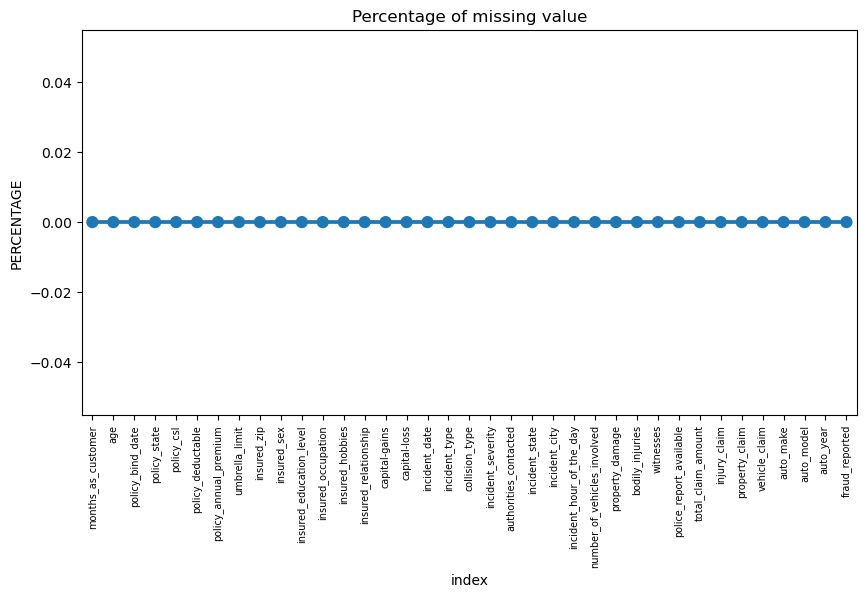

In [12]:
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()

plt.figure(figsize=(10,5))

ax=sns.pointplot('index',0,data=missing)
plt.xticks(rotation=90,fontsize=7)

plt.ylabel('PERCENTAGE')
plt.title('Percentage of missing value')

plt.show()

### visual representation of Null values- Row location

<AxesSubplot:>

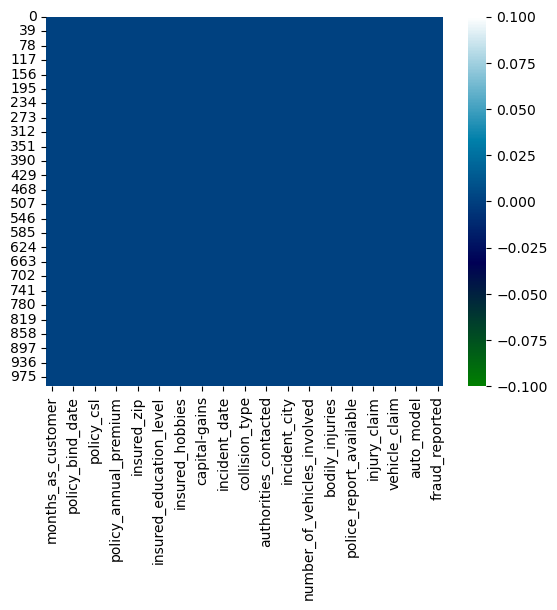

In [13]:
sns.heatmap(df.isnull(),cmap='ocean')

there is no missing value in the dataset at their position

<AxesSubplot:>

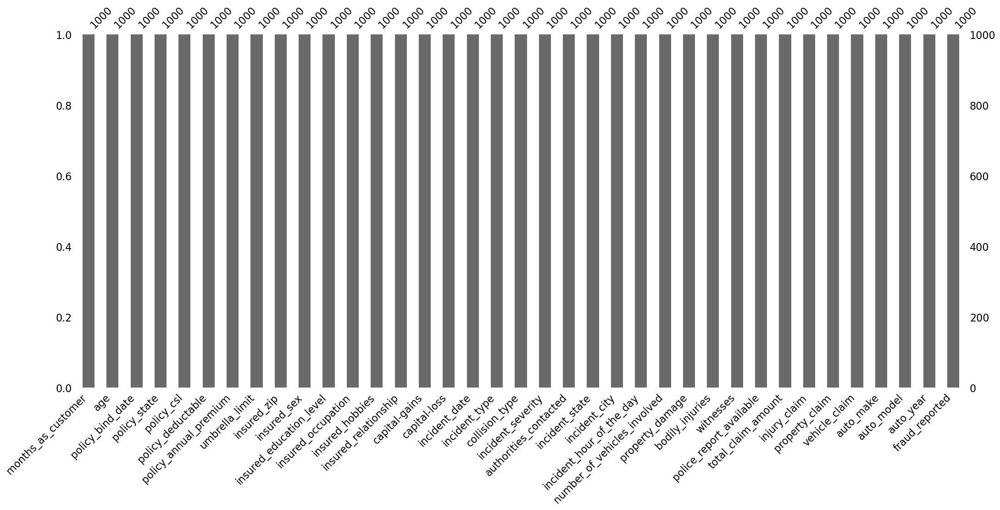

In [14]:
ms.bar(df)

So after getting a visual on the missing values we see that our dataset columns doesnot have null values present in them..

<AxesSubplot:>

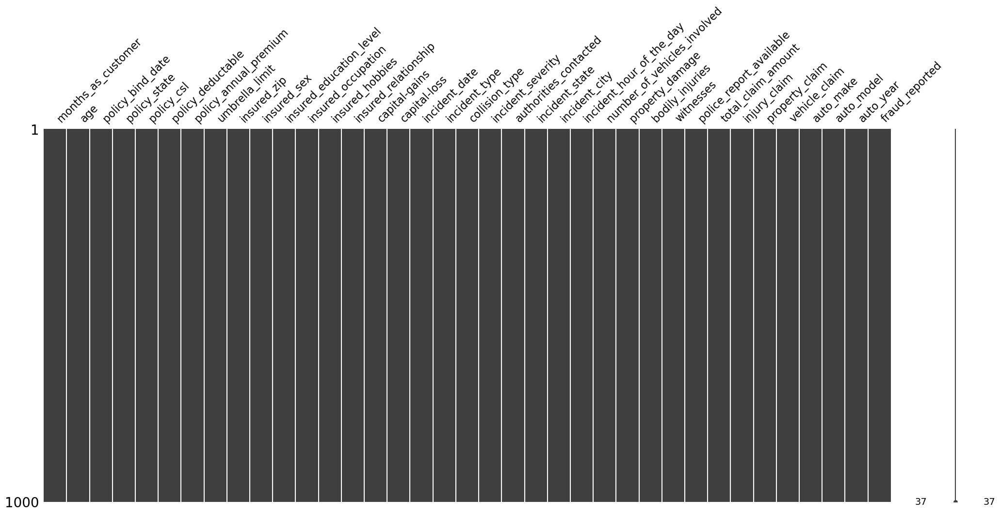

In [15]:
ms.matrix(df)

no missing value highlighted visually

## seperate the data columns

In [16]:
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("\n")
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')


Numerical Variables:
['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


In [17]:
len(cat_cols)

20

In [18]:
len(num_cols)

17

# Value Count Function

Let's check the list of value counts in each columns to find if there are any unexpected or corrupted entries in the dataset.

In [19]:
for i in df.columns:
    print(df[i].value_counts())
    print('='*99)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
1000    351
500     342
2000    307
Name: p

From above we can see all the values present in the object columns and their frequency.

Checking the number of rows covered by all the unique values present in our object data type columns. My observations from this are:

policy_bind_date has date related data
incident_date again has date related data
These two columns are marked as object data type but they hold date related information and will need to be handled accordingly.

Also we see rows that are filled with a "?" data in the below columns:

collision_type
property_damage
police_report_available
So we will need to name something meangingful to these values present in above 3 columns.

In [20]:
df[cat_cols].nunique().to_frame("Unique Values")

,Unique Values
policy_bind_date,951
policy_state,3
policy_csl,3
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6
incident_date,60
incident_type,4


Taking a look at all the unique value number for object datatype columns.

In [21]:
df[num_cols].nunique().to_frame("Unique Values")

,Unique Values
months_as_customer,391
age,46
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995
capital-gains,338
capital-loss,354
incident_hour_of_the_day,24
number_of_vehicles_involved,4


Taking a look at all the unique value number for numeric datatype columns.

<font size=6>**Data Pre Processing**

<font size=3>**Separating the Date column into seperate day - month -  year columns using pandas Datetime method**

In [22]:
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['policy_bind_Day'] = df['policy_bind_date'].apply(lambda x:x.day)
df['policy_bind_Month'] = df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_Year'] = df['policy_bind_date'].apply(lambda x:x.year)

# separating the Date column into seperate day - month -  year columns using pandas Datetime method
df['incident_date'] = pd.to_datetime(df['incident_date'])
df['incident_Day'] = df['incident_date'].apply(lambda x:x.day)
df['incident_Month'] = df['incident_date'].apply(lambda x:x.month)
df['incident_Year'] = df['incident_date'].apply(lambda x:x.year)

We have separated the date object datatype columns into 3 columns for day, month and year each.

**Dropping the original Date columns after separating the desired outputs**

In [23]:
df.drop(columns = ['policy_bind_date','incident_date'], axis=1, inplace=True)

In the above cell we have dropped the original date object datatype columns after we got our separate day, month and year values.

### finding "?" mark

In [24]:
result = df.isin(["?"]).sum()
result

months_as_customer               0
age                              0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_available        343
total_claim_amount               0
injury_claim        

In [25]:
df['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

### Replacing "?" mark

In [26]:
df['collision_type'] = df['collision_type'].replace('?', 'questionable')
df['property_damage'] = df['property_damage'].replace('?', 'questionable')
df['police_report_available'] = df['police_report_available'].replace('?', 'questionable')

#### Checking Null value again

In [27]:
result = df.isin(["?"]).sum()
result

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_cl

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_hobbies              1000 non-null   object 
 12  insured_relationship         1000 non-null   object 
 13  capital-gains      

### checking unique values

In [29]:
df.nunique()

months_as_customer             391
age                             46
policy_state                     3
policy_csl                       3
policy_deductable                3
policy_annual_premium          991
umbrella_limit                  11
insured_zip                    995
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_type                    4
collision_type                   4
incident_severity                4
authorities_contacted            5
incident_state                   7
incident_city                    7
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  3
bodily_injuries                  3
witnesses                        4
police_report_available          3
total_claim_amount             763
injury_claim        

In [30]:
df["incident_Year"].value_counts()

2015    1000
Name: incident_Year, dtype: int64

In [31]:
df["fraud_reported"].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

- There are two unique values in the target columns N and Y

We can say that whether Fraud or Not

We can also observe that the class imbalancing issue here so will balance the data using SMOTE before machine learning modeling.

In [32]:
# let's check the dataframe
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,questionable,Minor Damage,Police,VA,Riverwood,8,1,questionable,0,0,questionable,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,questionable,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,questionable,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015


## find duplicate values

In [33]:
df.duplicated().sum()

0

In [34]:
df.shape

(1000, 41)

In [35]:
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("\n")
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')


Numerical Variables:
['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'incident_Year']


## Descriptive Statistics

In [36]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.0
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000,13.08400,3.407000,2015.0
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391,10.44318,3.276291,0.0
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,2015.0
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000,2.00000,1.000000,2015.0
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,2015.0
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000,22.00000,5.000000,2015.0
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,2015.0


This gives the statistical information of the dataset . The summary of this dataset looks perfect.since there is negative/invalid values present.

From the above description we can observe the following things.

- The counts of all the columns are same which means there is no missing values present in any columns
- The mean is greater than the meadian(50%) in some columns which means they are skewed to right.
- The mean and the median(50%) are almost equal in some column which means the data is symmetric in these columns hence the data is normal and no skewness present here.
- There is a huge difference in 75% and max it shows that huge outliers present in the columns.
- In summarising the data we can observe that the dataset contains the person's age between 19 years to 64 years.

### Checking Description through heatmap also.

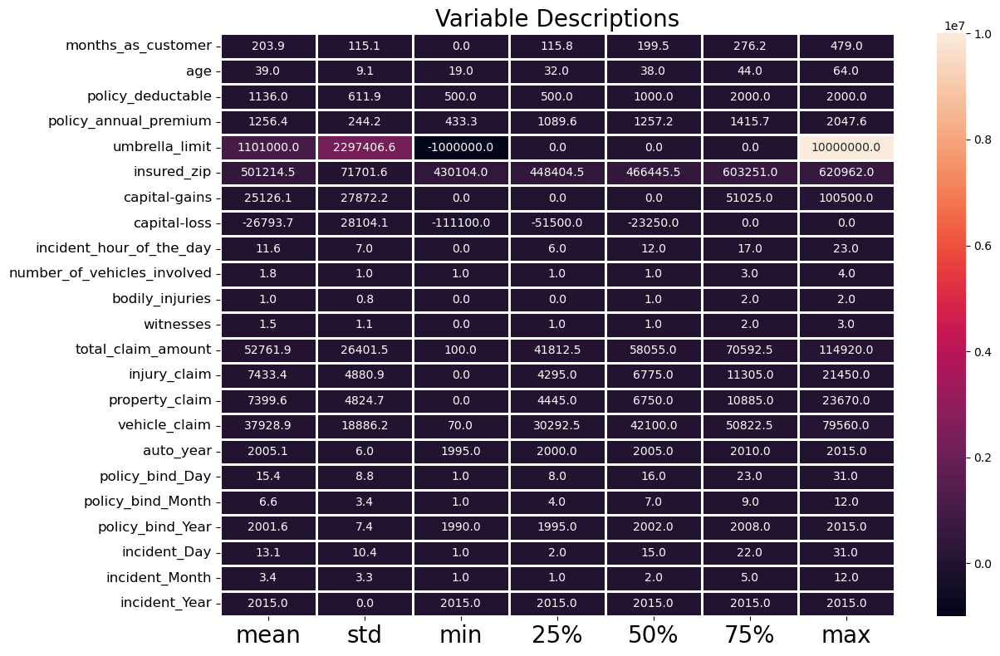

In [37]:
plt.figure(figsize=(13,8))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=1,annot=True,fmt='.1f')
plt.xticks(fontsize=20)
plt.yticks(rotation=0, fontsize=12)
plt.title('Variable Descriptions', fontsize=20)
plt.tight_layout()
plt.show()

#### Observation of Describe of Datasets:

- We observe from description of dataset that there are 1000 rows and   columns, in which 23 columns contains Continuous data and 18 columns contains Categorical data.
- There are no negative value present in dataset but data is not normally distributed and also skewness is present.
- we will check for value 0, as 0 value is also null value but it is value that why while checking for null value it is not counted.

In [38]:
cat_cols.size

18

In [39]:
len(num_cols)

23

In [40]:
df.describe(include='object')

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,3,3,2,7,14,20,6,4,4,4,5,7,7,3,3,14,39,2
top,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,questionable,questionable,Saab,RAM,N
freq,352,351,537,161,93,64,183,419,292,354,292,262,157,360,343,80,43,753


From above desribe function we are describing the data from all the object type columns and we notice the following-

1) Unique values in each columns
2) Most frequent value in each column. (mode)
3) Frequency of the most occuring value.

In [41]:
df.shape

(1000, 41)

## Data Visualization

### Univariate Analysis

### Using Countplot for categorical columns

In [42]:
df.head(3)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,questionable,Minor Damage,Police,VA,Riverwood,8,1,questionable,0,0,questionable,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,9,6,2000,22,2,2015


In [43]:
df_cat=df.drop(columns=num_cols,axis=1)
df_n=df.drop(columns=cat_cols,axis=1)

Count Plot for  policy_state  column
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


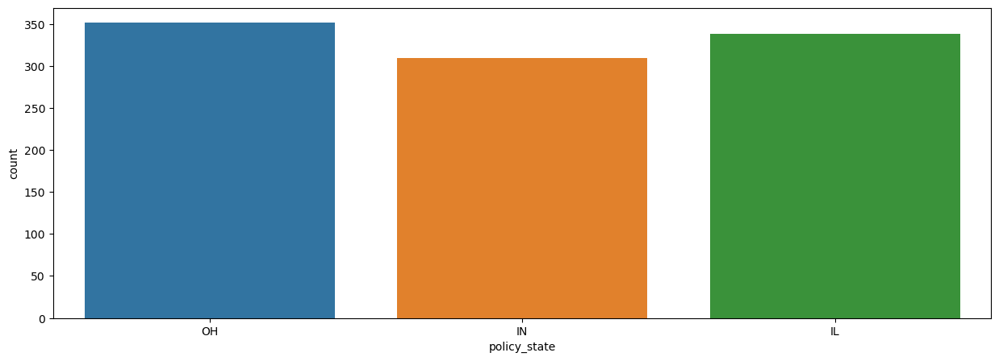

Count Plot for  policy_csl  column
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


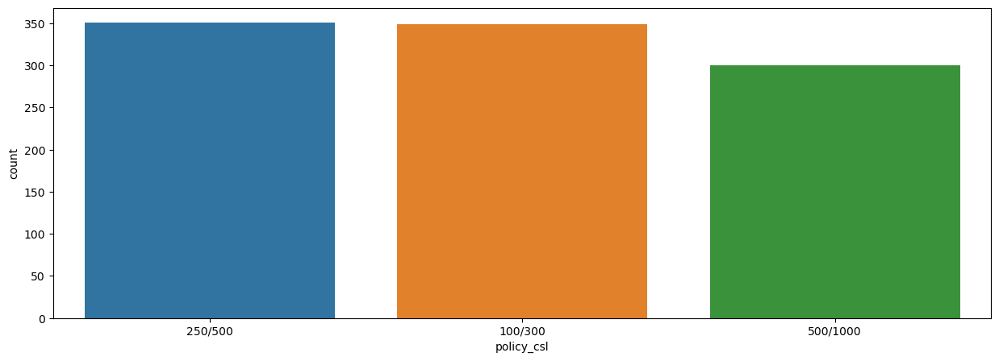

Count Plot for  insured_sex  column
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


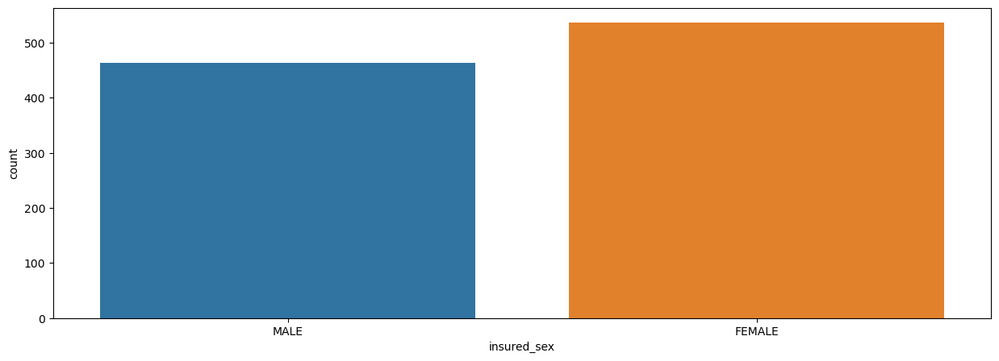

Count Plot for  insured_education_level  column
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


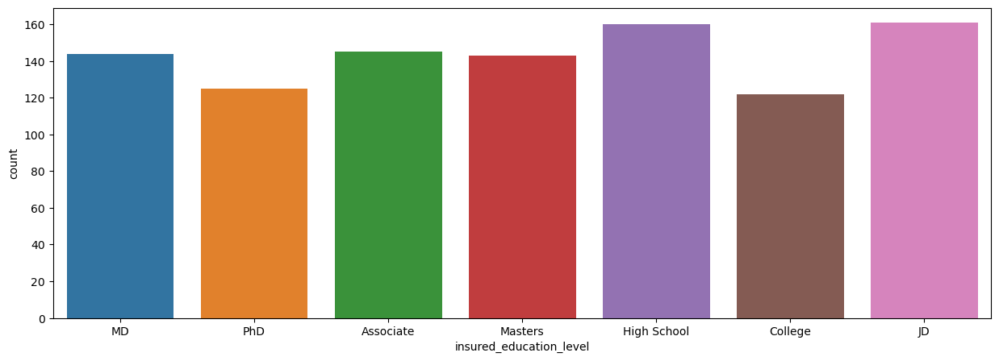

Count Plot for  insured_occupation  column
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


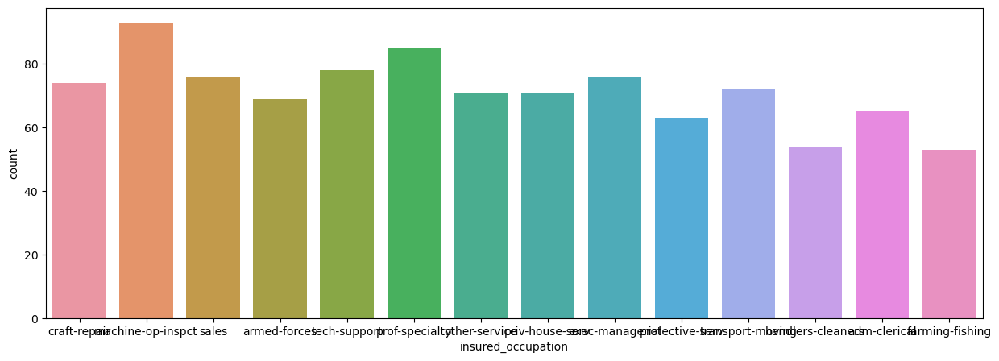

Count Plot for  insured_hobbies  column
reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


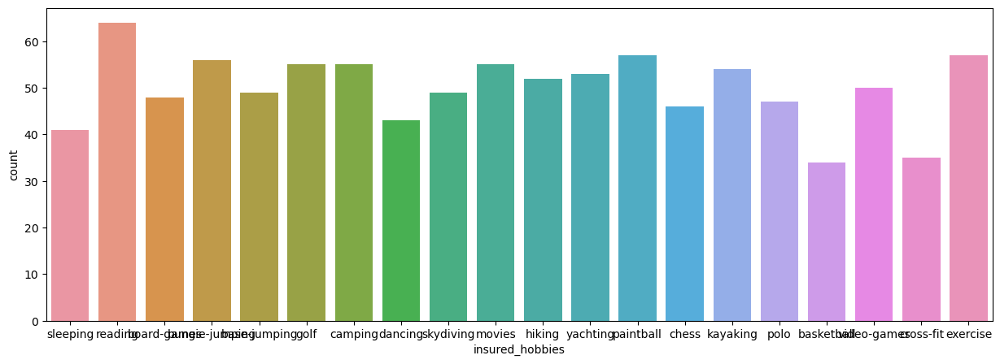

Count Plot for  insured_relationship  column
own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


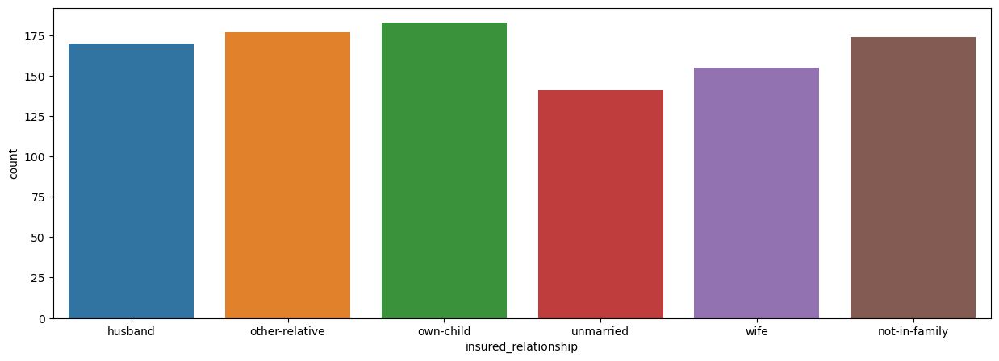

Count Plot for  incident_type  column
Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


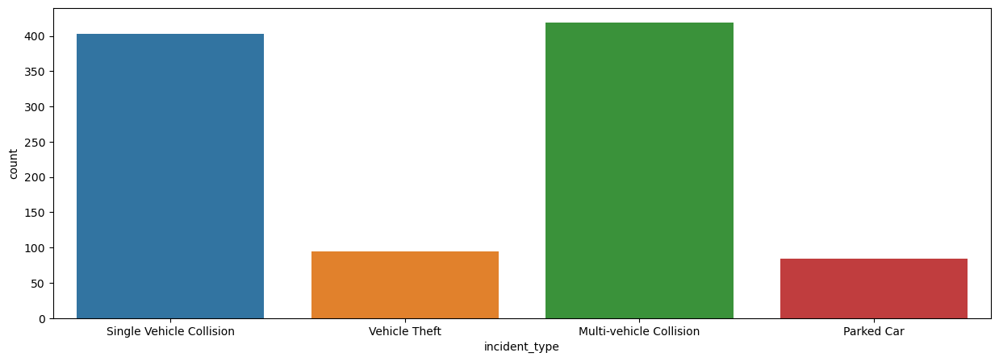

Count Plot for  collision_type  column
Rear Collision     292
Side Collision     276
Front Collision    254
questionable       178
Name: collision_type, dtype: int64


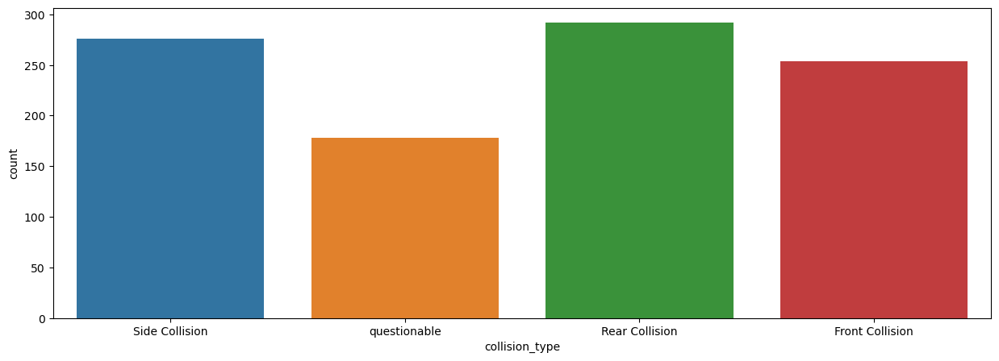

Count Plot for  incident_severity  column
Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


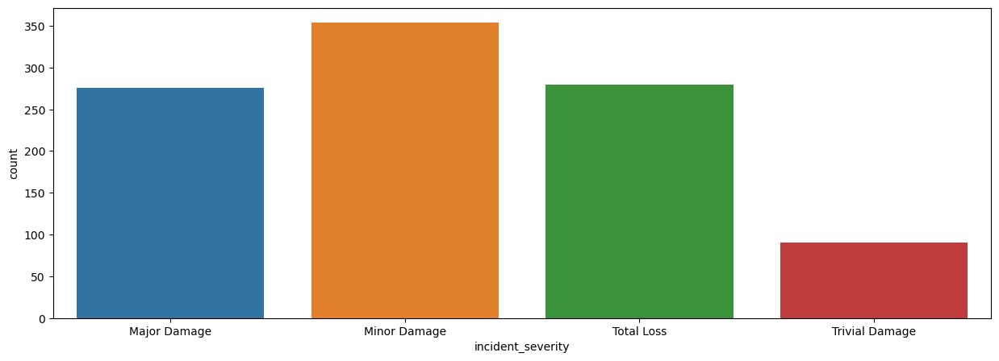

Count Plot for  authorities_contacted  column
Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


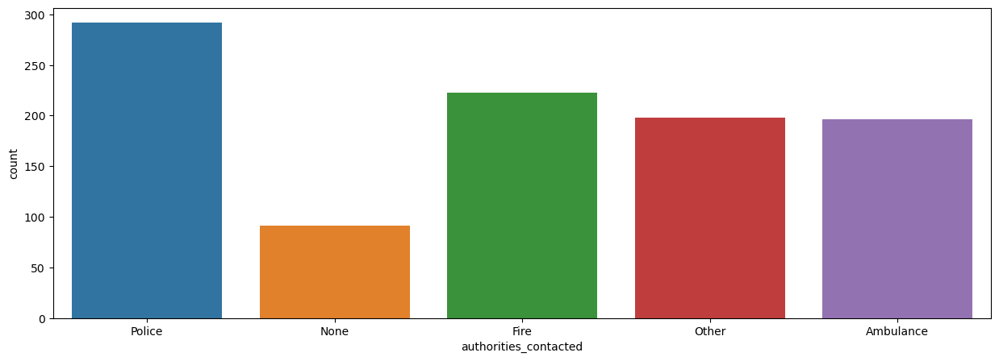

Count Plot for  incident_state  column
NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


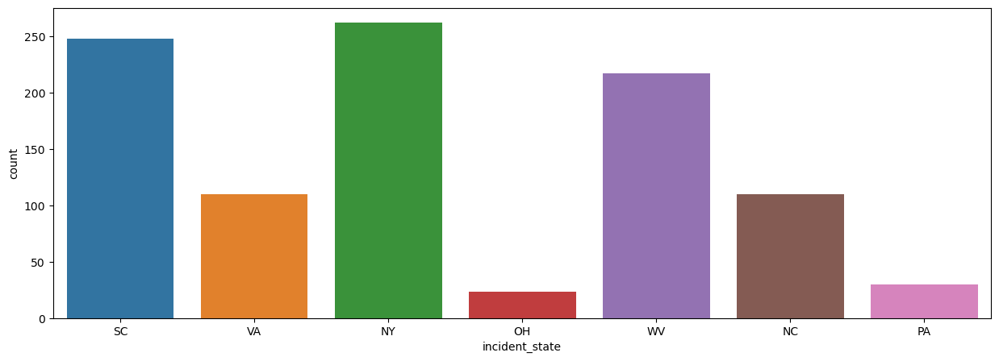

Count Plot for  incident_city  column
Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


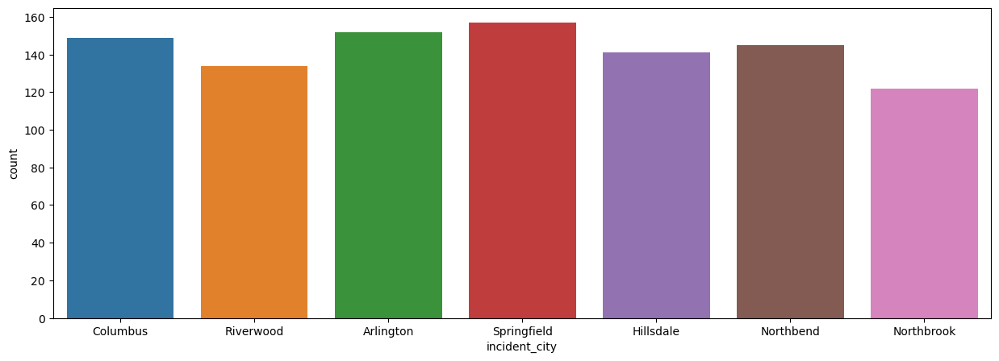

Count Plot for  property_damage  column
questionable    360
NO              338
YES             302
Name: property_damage, dtype: int64


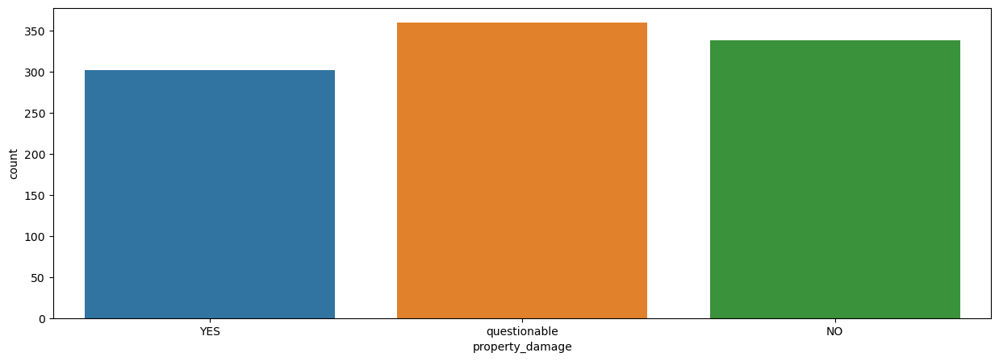

Count Plot for  police_report_available  column
questionable    343
NO              343
YES             314
Name: police_report_available, dtype: int64


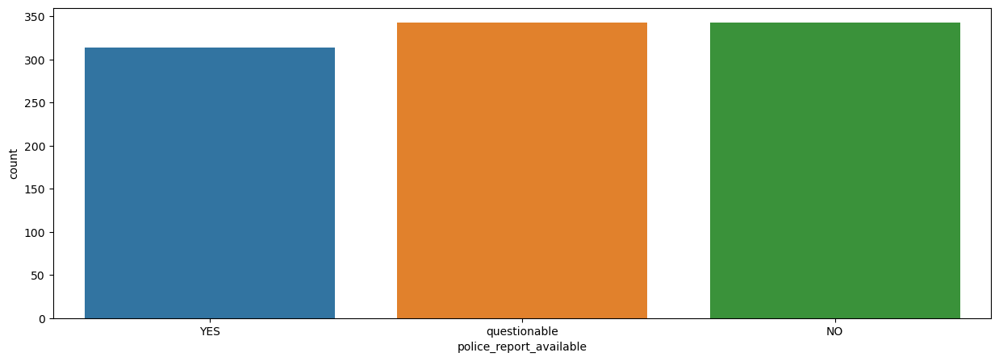

Count Plot for  auto_make  column
Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


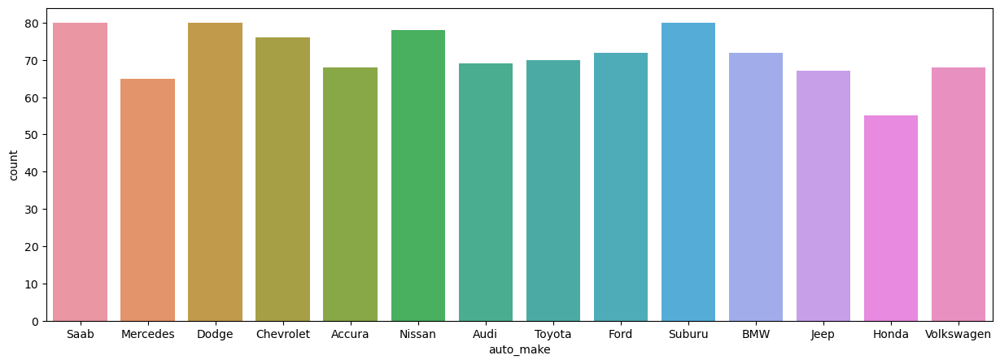

Count Plot for  auto_model  column
RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


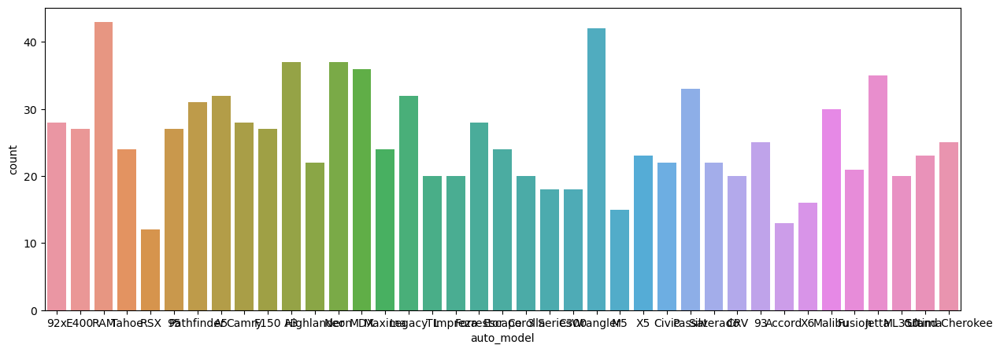

Count Plot for  fraud_reported  column
N    753
Y    247
Name: fraud_reported, dtype: int64


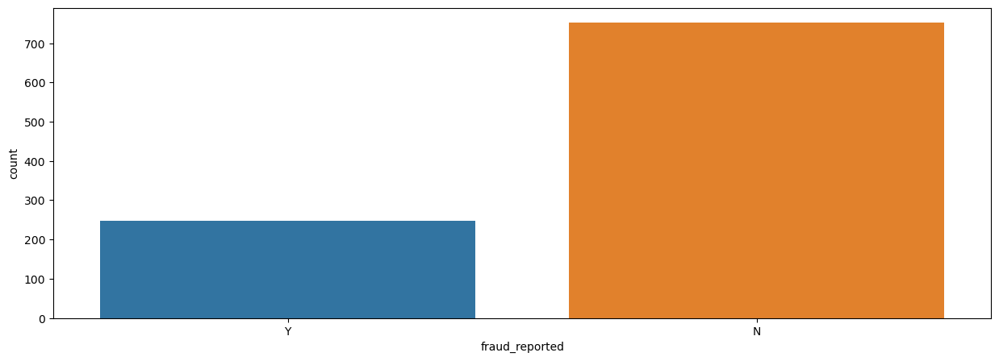

In [44]:
for i in df_cat:
    print('Count Plot for ',i,' column')
    plt.figure(figsize=(15,5))
    print(df[i].value_counts())
    sns.countplot(i,data=df_cat)
    print("="*100)
    plt.show()

### (categorial column % wise spread)

In [45]:
df["fraud_reported"].unique()

array(['Y', 'N'], dtype=object)

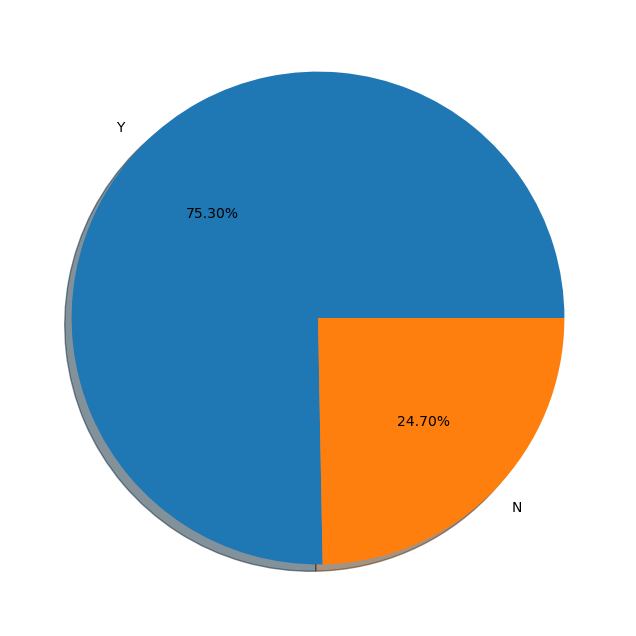

In [46]:
# visualize the count of Relationship of the people(categorial column % wise spread)
#labels = 'Location', 'WindGustDir','WindDir9am','WindDir3pm','RainTomorrow','RainToday'
labels = 'Y', 'N'
fig, ax = plt.subplots(figsize=(10,8))
ax.pie(df["fraud_reported"].value_counts(), labels=labels, autopct='%1.2f%%', shadow=True)
plt.show()

Single digit category column name: policy_state


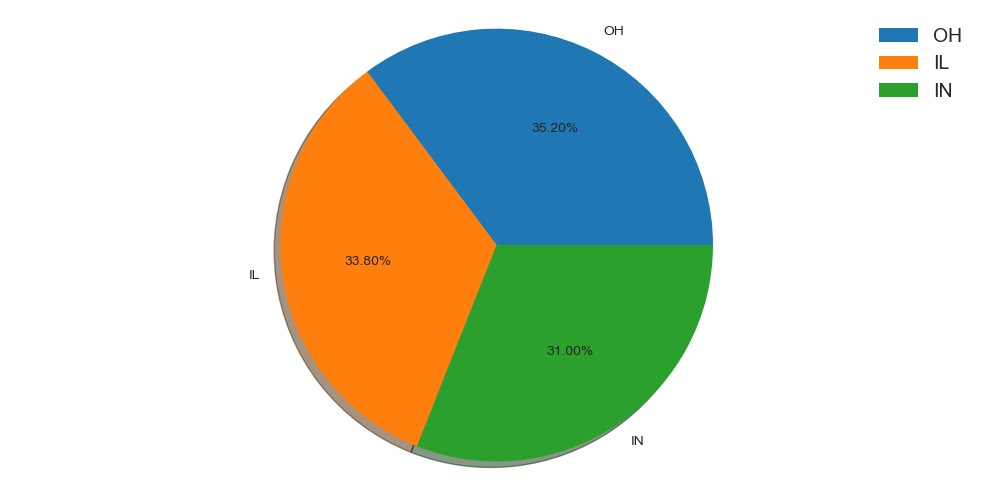

Single digit category column name: policy_csl


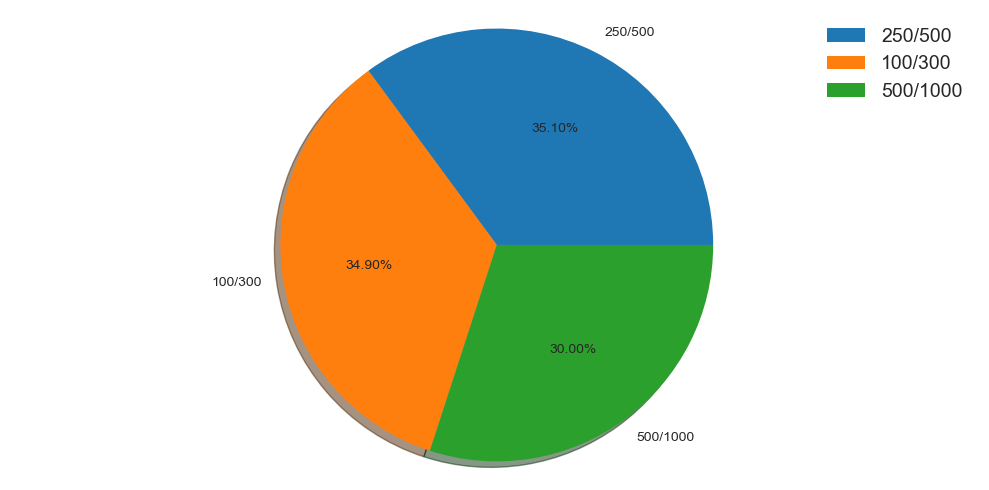

Single digit category column name: insured_sex


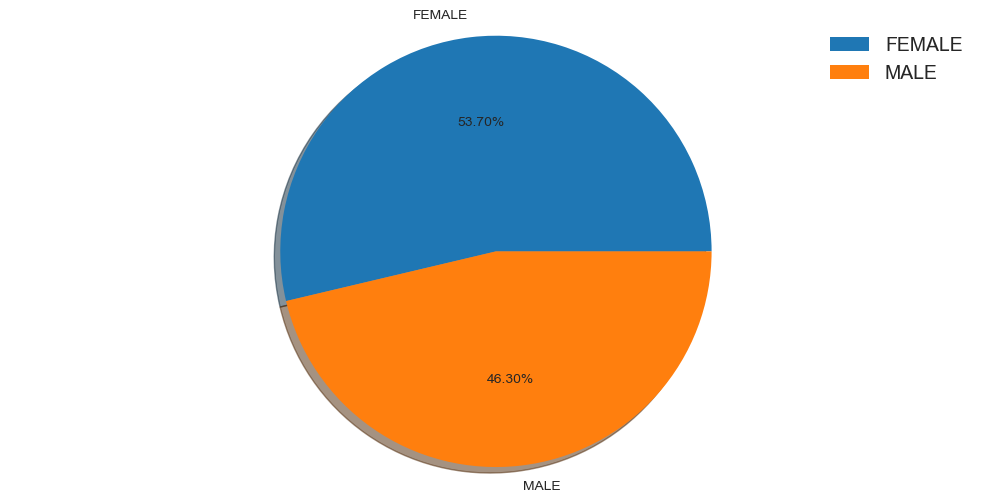

Single digit category column name: insured_education_level


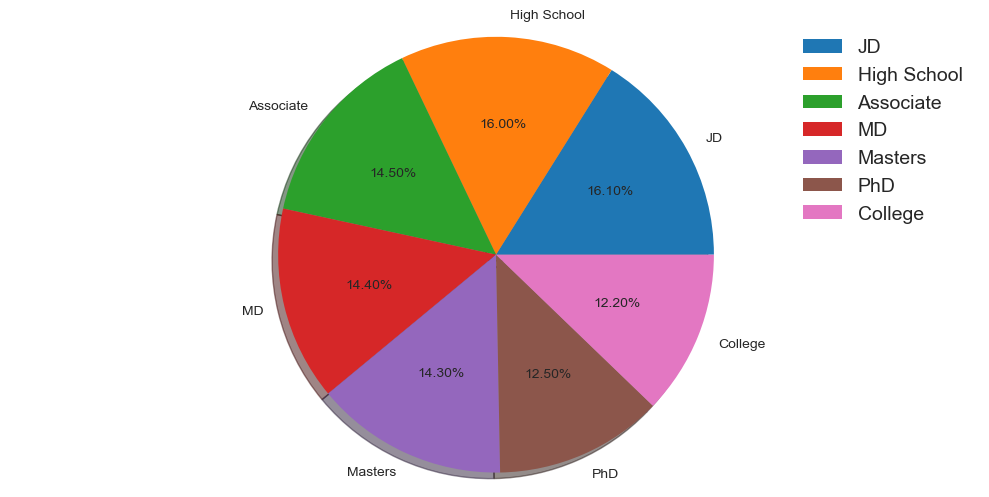

Single digit category column name: insured_occupation


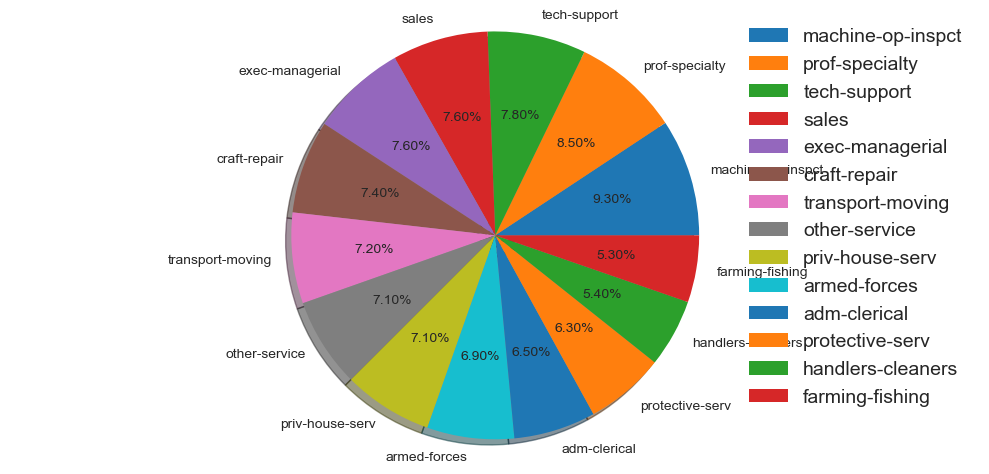

Single digit category column name: insured_hobbies


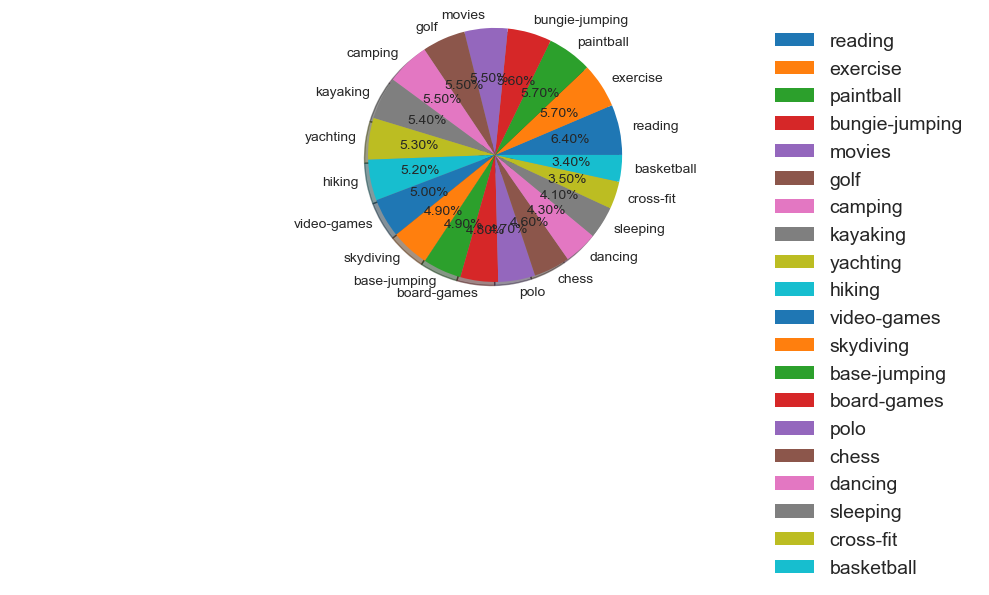

Single digit category column name: insured_relationship


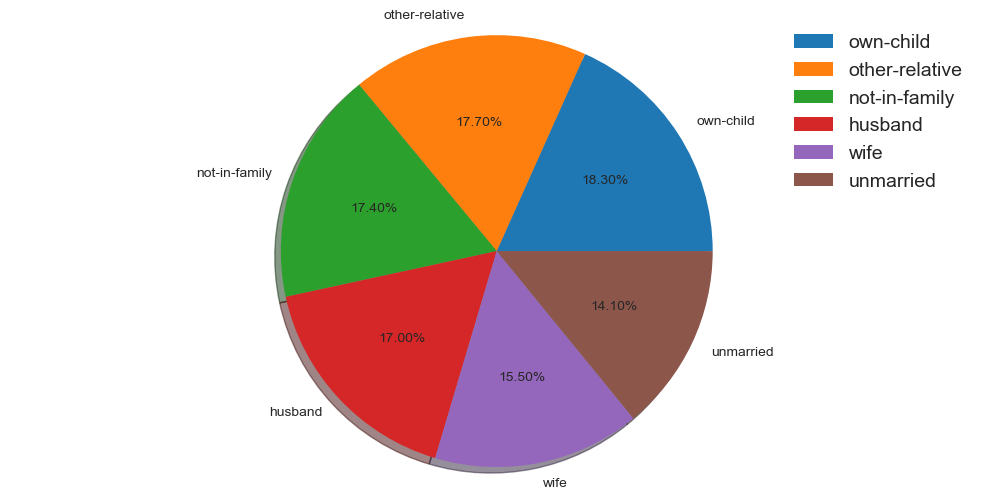

Single digit category column name: incident_type


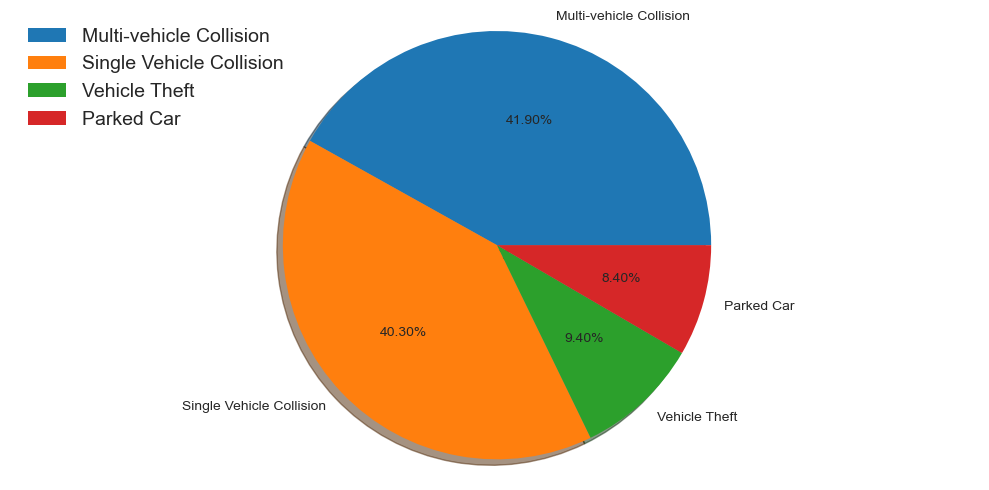

Single digit category column name: collision_type


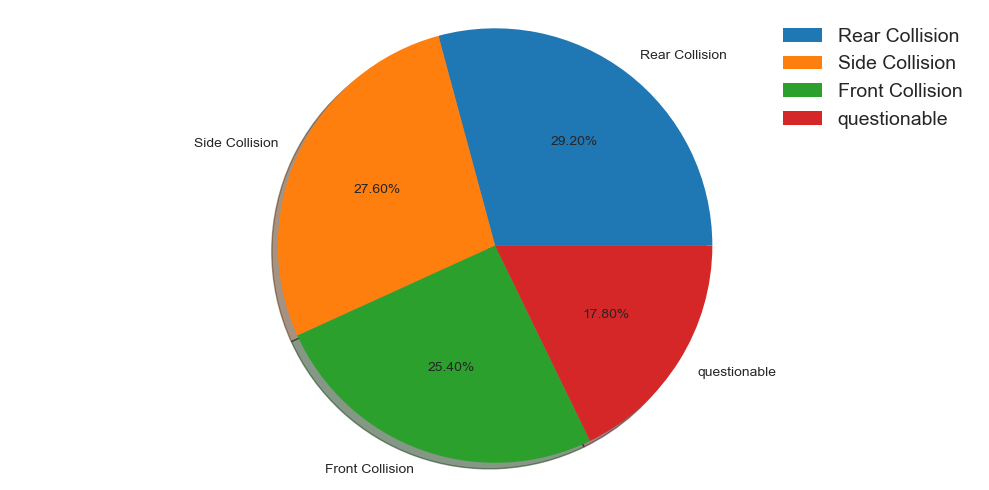

Single digit category column name: incident_severity


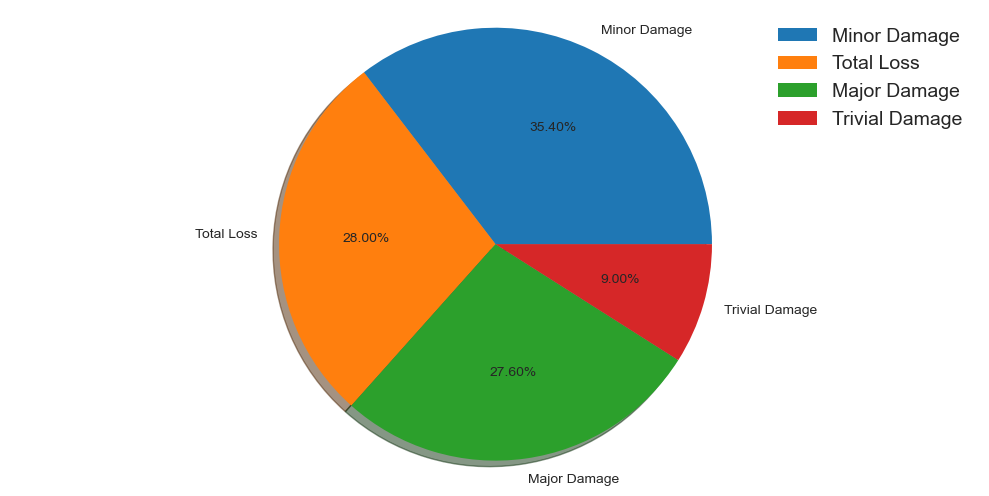

Single digit category column name: authorities_contacted


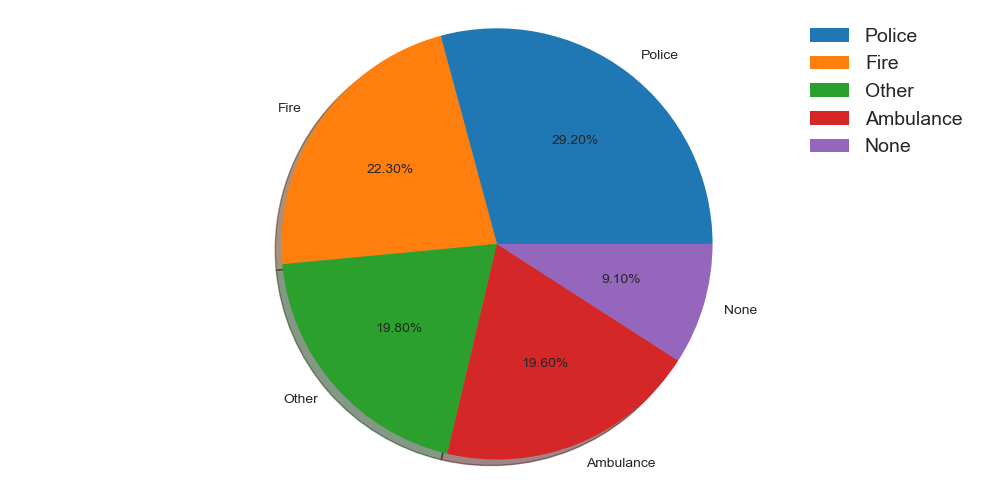

Single digit category column name: incident_state


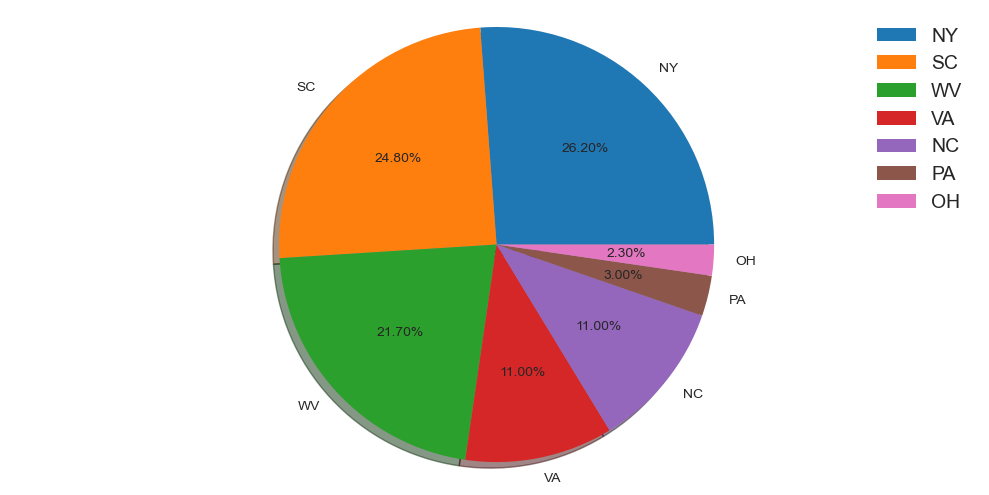

Single digit category column name: incident_city


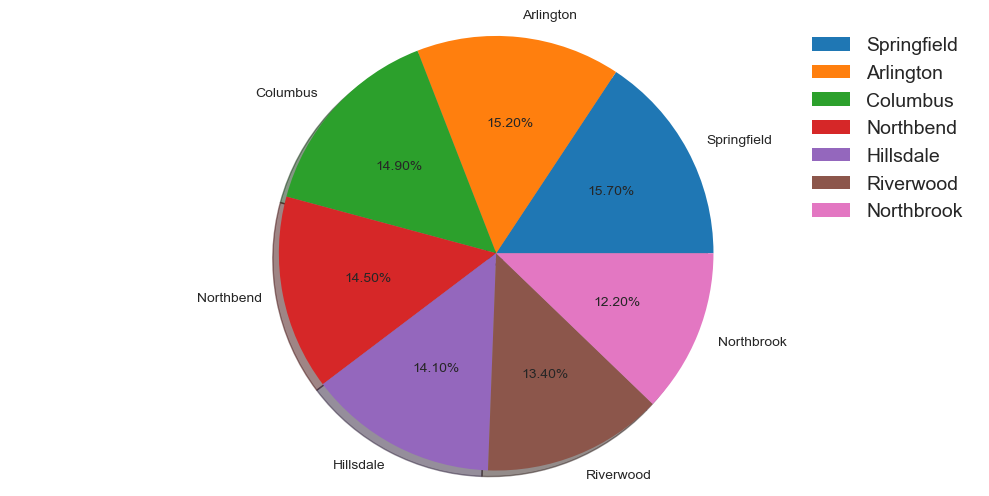

Single digit category column name: property_damage


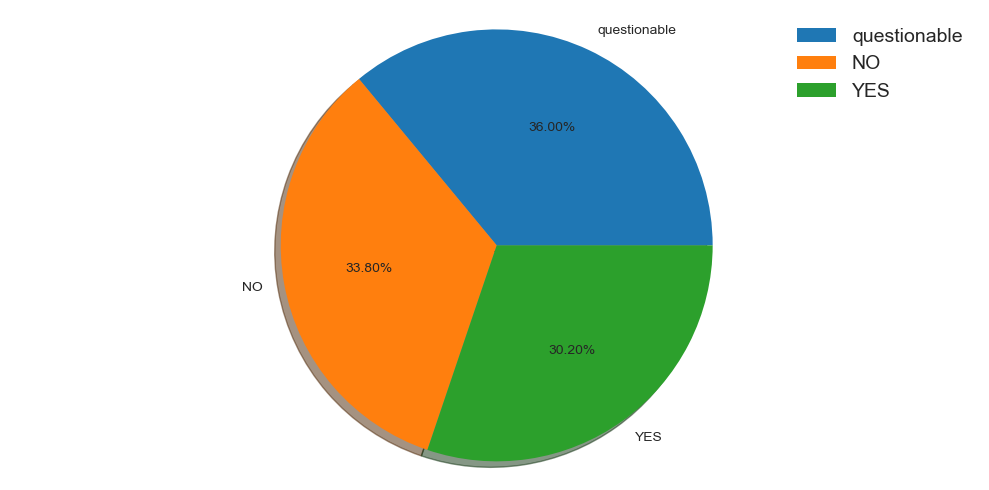

Single digit category column name: police_report_available


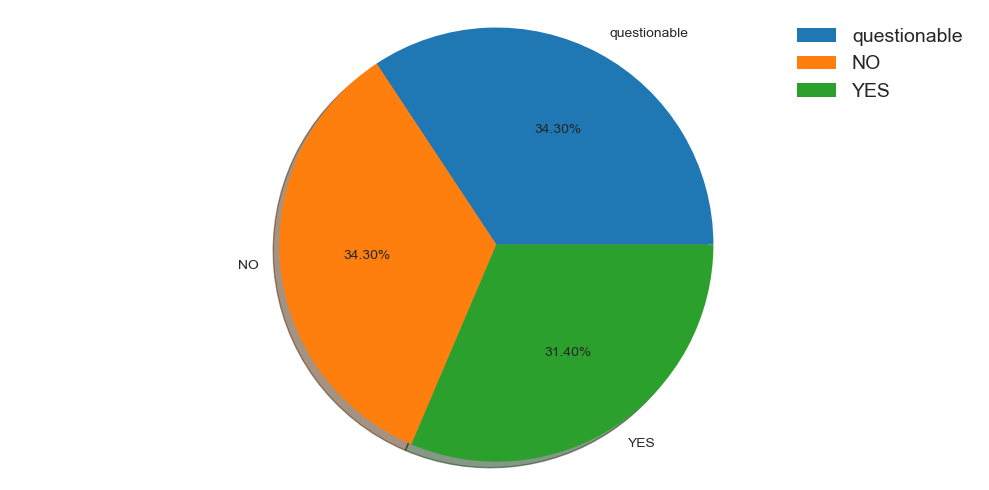

Single digit category column name: auto_make


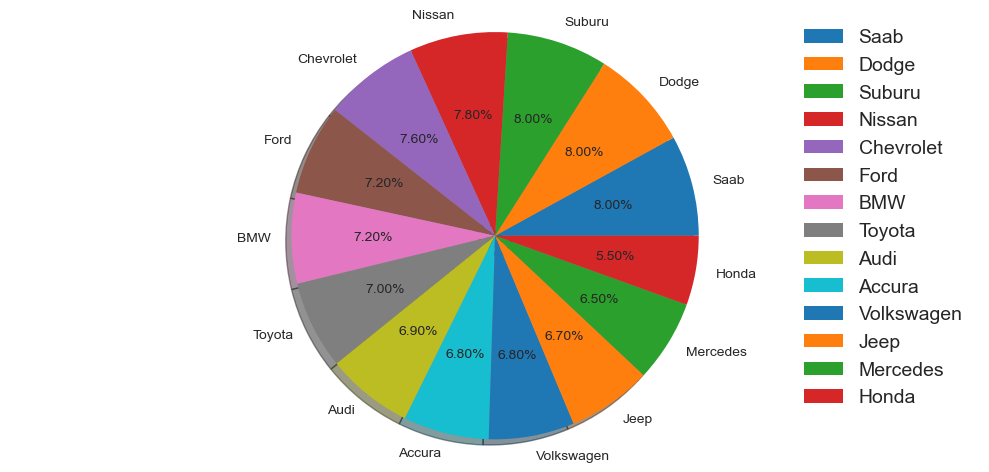

Single digit category column name: auto_model


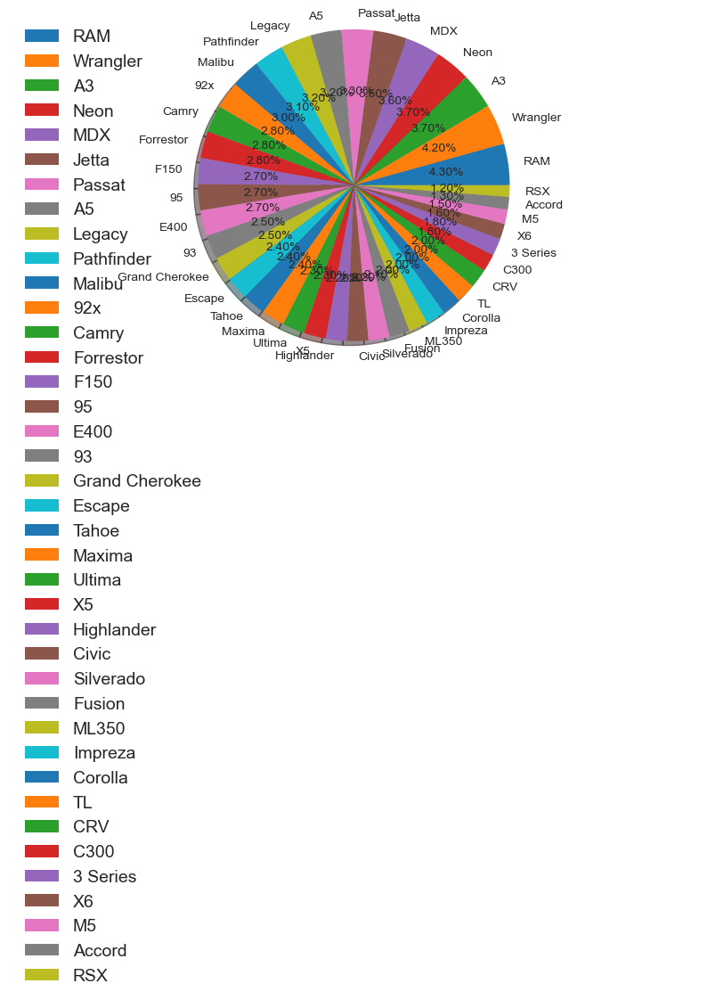

Single digit category column name: fraud_reported


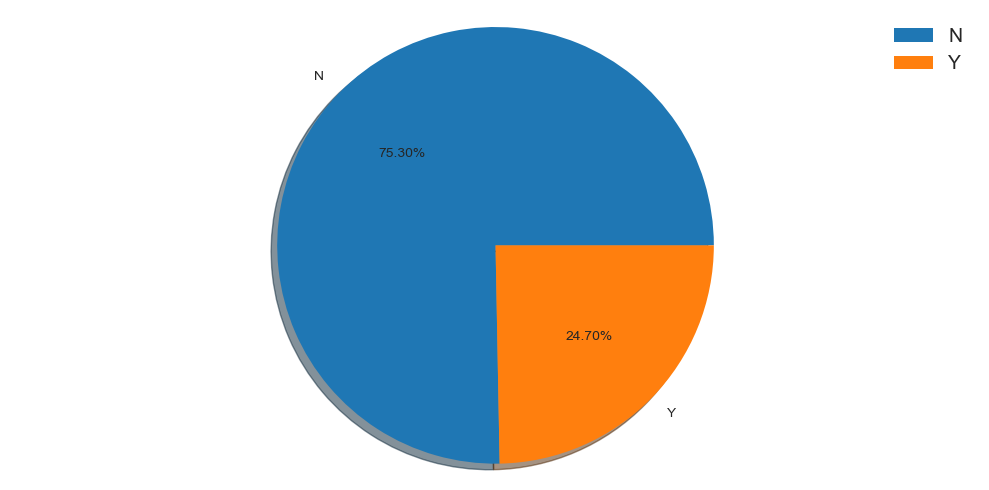

In [48]:
def generate_pie(x):
    plt.style.use('seaborn-white')
    plt.figure(figsize=(10,5))
    plt.pie(x.value_counts(), labels=x.value_counts().index, shadow=True, autopct='%1.2f%%')
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

col1 = ['fraud_reported', 'insured_sex', 'policy_state', 'policy_csl', 'policy_deductable', 'bodily_injuries',
        'police_report_available', 'property_damage', 'incident_type', 'collision_type', 'incident_severity',
        'number_of_vehicles_involved', 'witnesses', 'authorities_contacted', 'insured_relationship',
        'insured_education_level', 'incident_state', 'incident_city']

for i in df[cat_cols]:
    print(f"Single digit category column name:", i)
    generate_pie(df[i])

My observations:<br>
 
1)We can see that less number of data cover the yes portion of fraud reported and since this is our target label it indicates towards the problem of class imbalance as well<br> 

2)We can see that almost both male and female have insurance but the data coverage for female is a bit higher than their male couterparts<br>

3)For policy state Ohio has a larger chunk of data as compared to Illinois and Indiana but all 3 have pretty much similar data points<br>

4)in the policy sections again we see that 250/500 category has a slighty higher data coverage than the 100-300 and 500/1000 categories<br>

5)With respect to policy deductable criteria we can see 1000 to be at a higher rate than it's 500 and 2000 data counterparts.<br>

6)In terms of bodily injueries the severity for level 0 is slightly higher than the level 2 and 1<br>

7)For police report availability only 31.40 percent people were able to produce genuine reports while the remaining 34.30 percent were either unable to show a report or the authenticity was questionable<br>

8)When checking for property damage data we see that 36 percent of the information is questionable while 33.80 percent people did not face any property damage so only 30.20 percent people suffered from property damage.<br>

9)When we check for accident type then single vehicle and multi vehicle collisions have covered more than 40 percent data each and then we have 9.40 percent incidents for vehicle theft and 8.40 percent incidents for parked car.<br>

10)For collision type categories we see 29.20 percent incident vehicles with rear collision which is like the highest and 17.80 percent of vehicle incidents are questionable.<br>

11)Measuring the incident severity the highest category covers for minor damages with 35.40 percent and lowest number in incident severity is of 9 percent that only has trivial damage data<br>

12)For number of vehicles being involved in an incident majorly lies for 1 and 3<br>

13)When we check for witnesses section then all the categories of witnesses are almost similarly distributed<br>

14)he data on whether an authority was contacted after an accident covers the police being notified the most then the fire brigade and ambulances but also has data on others being called and none being informed when it came to contacting people.<br>

15)Again for insured relationship column I see almost all the categorical value equally distributed and covering the data rows.<br>

16)Similar to insured relationship even insured education level column has it's data rows distributed equally amongst all the categorical values it holds.<br>

17)For the incident state column I see major portion of data rows are covered by New York, South Carolina and West Virginia states.<br>

18)While checking for incident related city all the cities that are listed in the column have an equal share of data coverage

### Realtionship between numeric and Categorial column

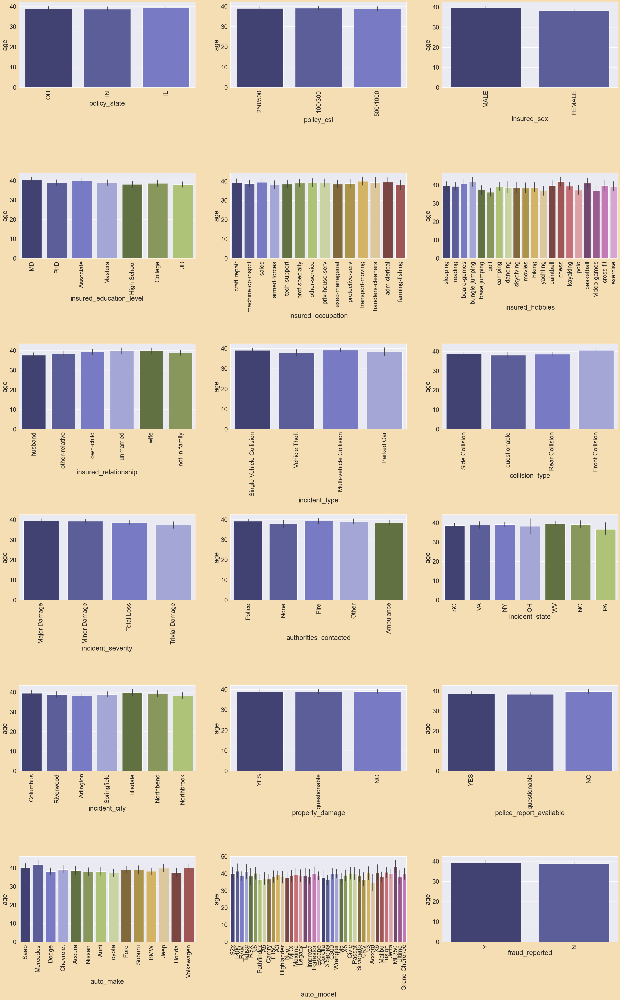

In [49]:
sns.set_style('darkgrid')
sns.set(font_scale=2)
plt.figure(facecolor='wheat',figsize=(38,60))
p=1
for i in cat_cols:
    if p<=25:
        ax=plt.subplot(6,3,p)
        sns.barplot(x=df[i],palette='tab20b',y='age',data=df)
        plt.xticks(rotation=90)
    p+=1
    
plt.subplots_adjust(hspace=1)
plt.show()

### Using Histplot for continuous columns

#Histplot for months_as_customer column
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


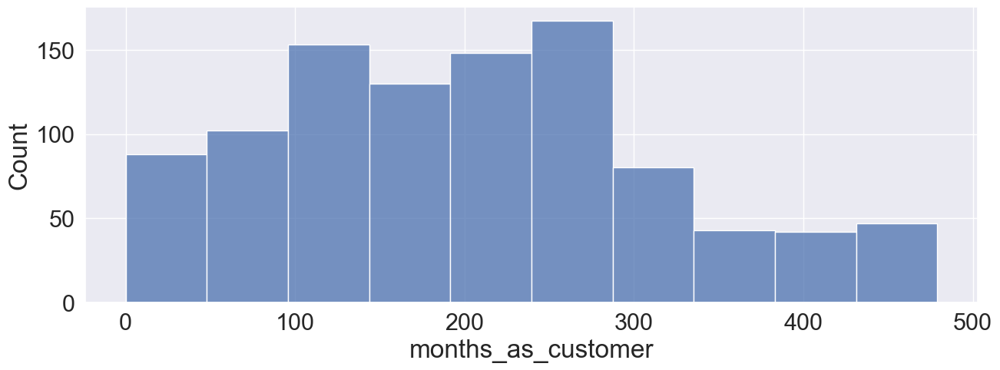

#Histplot for age column
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


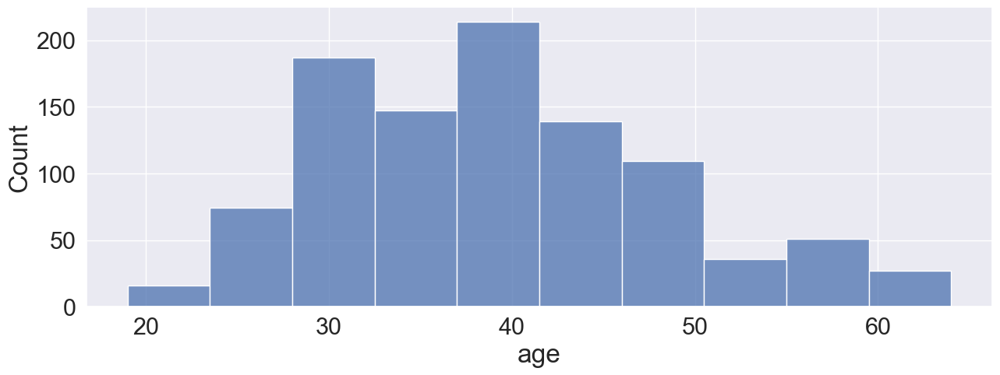

#Histplot for policy_deductable column
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64


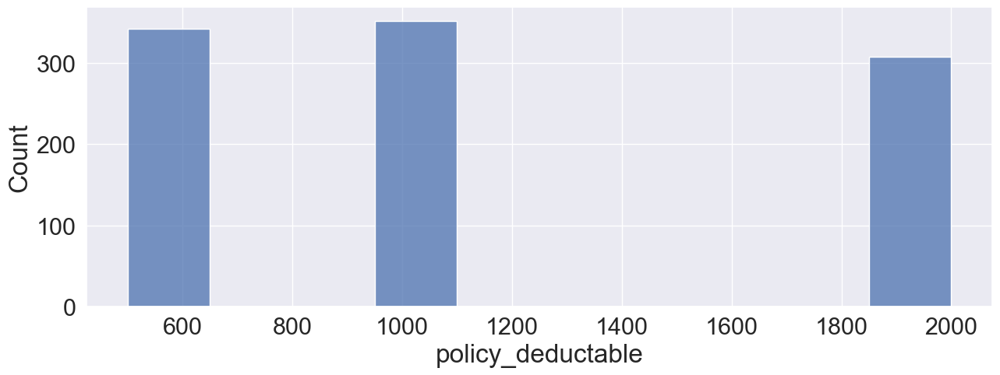

#Histplot for policy_annual_premium column
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: policy_annual_premium, Length: 991, dtype: int64


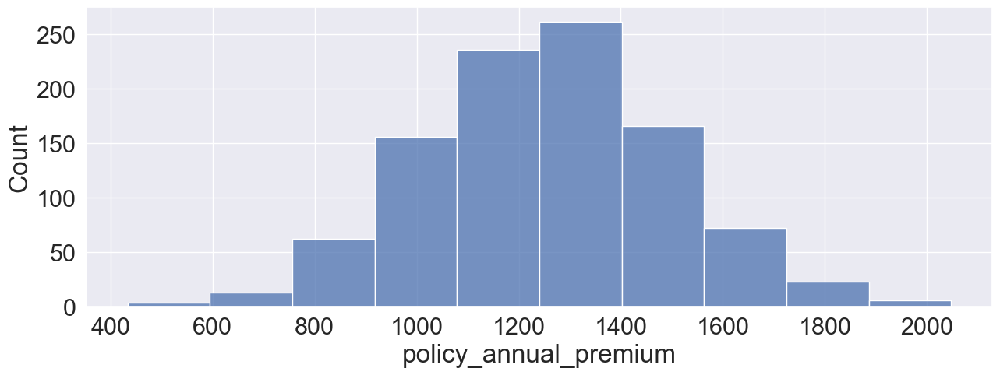

#Histplot for umbrella_limit column
 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64


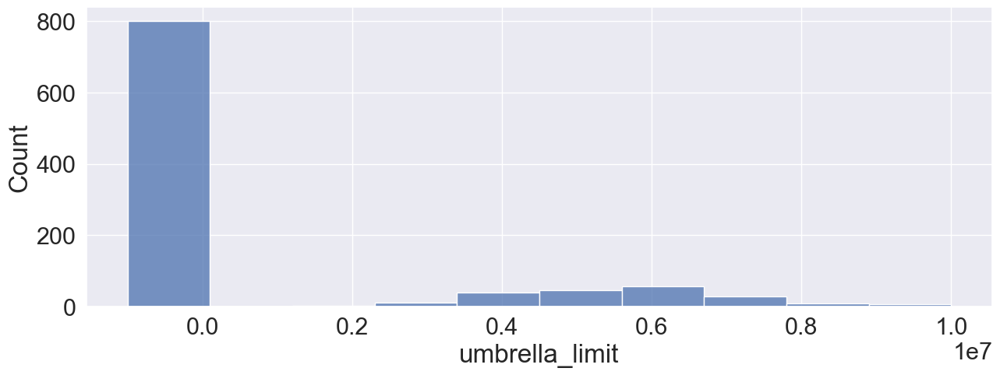

#Histplot for insured_zip column
477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: insured_zip, Length: 995, dtype: int64


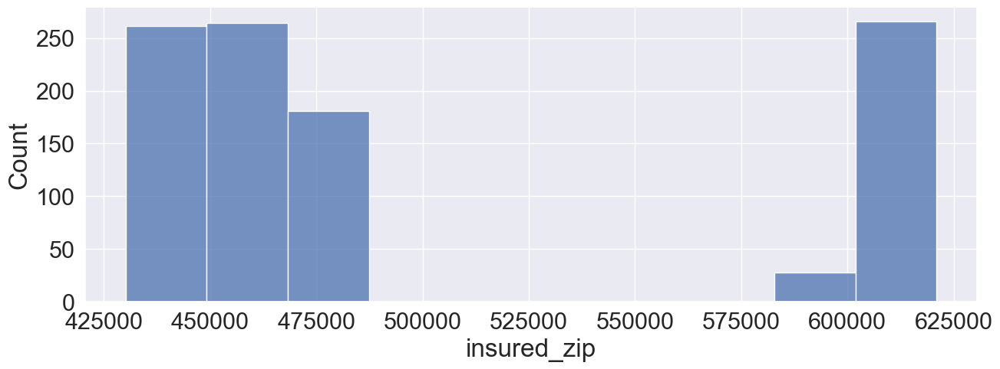

#Histplot for capital-gains column
0        508
46300      5
51500      4
68500      4
55600      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: capital-gains, Length: 338, dtype: int64


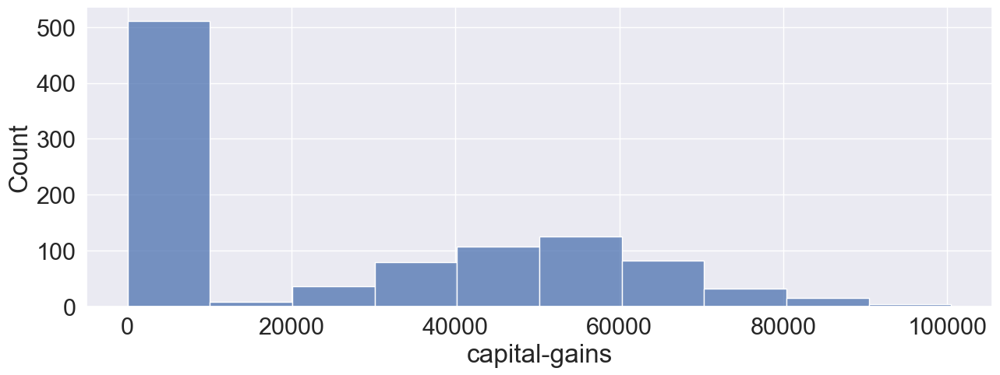

#Histplot for capital-loss column
 0        475
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700      1
-82100      1
Name: capital-loss, Length: 354, dtype: int64


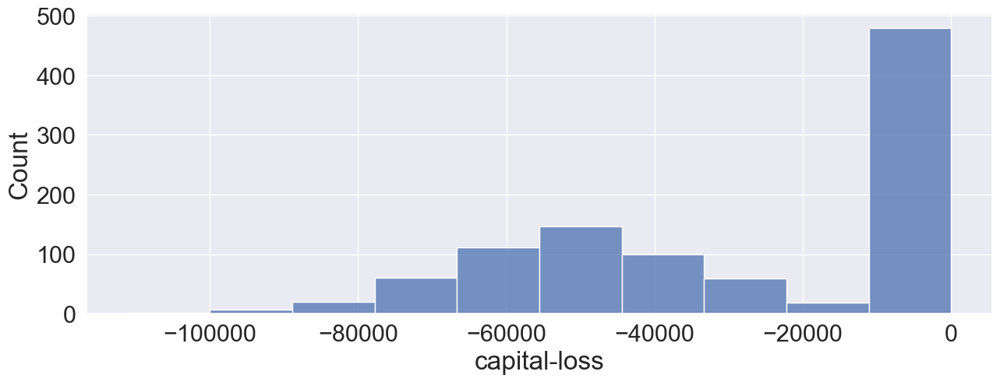

#Histplot for incident_hour_of_the_day column
17    54
3     53
0     52
23    51
16    49
13    46
10    46
4     46
6     44
9     43
14    43
21    42
18    41
12    40
19    40
7     40
15    39
22    38
8     36
20    34
5     33
2     31
11    30
1     29
Name: incident_hour_of_the_day, dtype: int64


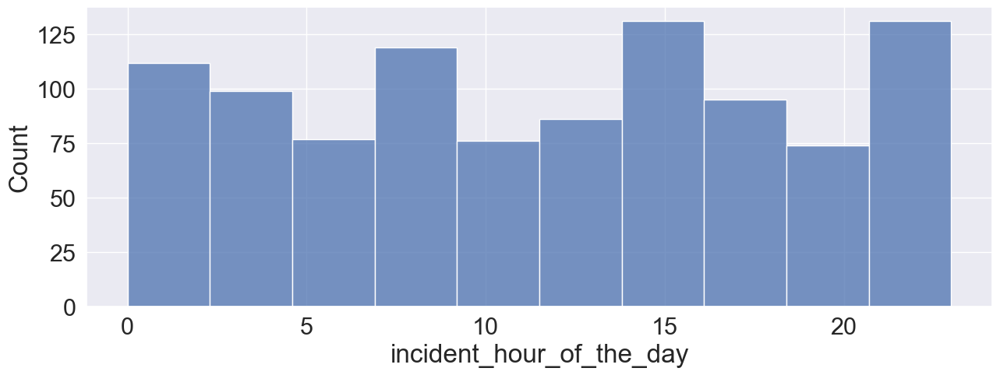

#Histplot for number_of_vehicles_involved column
1    581
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64


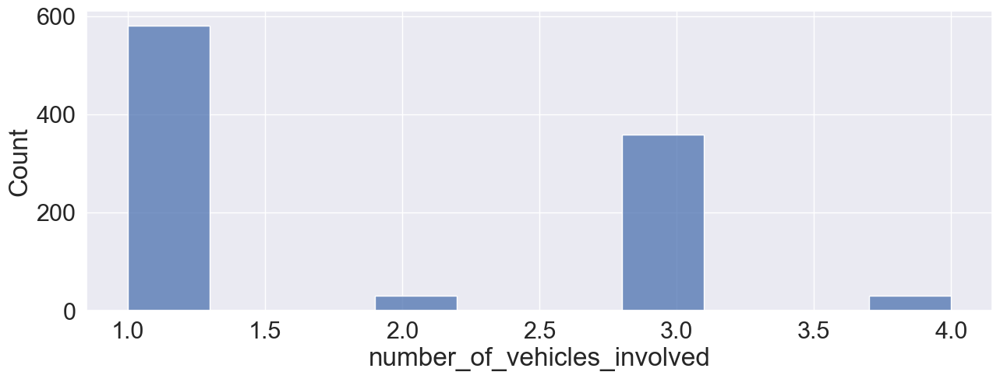

#Histplot for bodily_injuries column
0    340
2    332
1    328
Name: bodily_injuries, dtype: int64


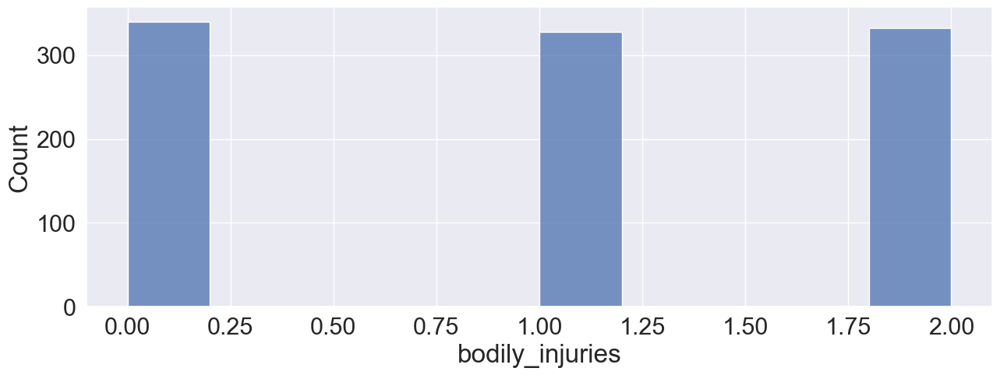

#Histplot for witnesses column
1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64


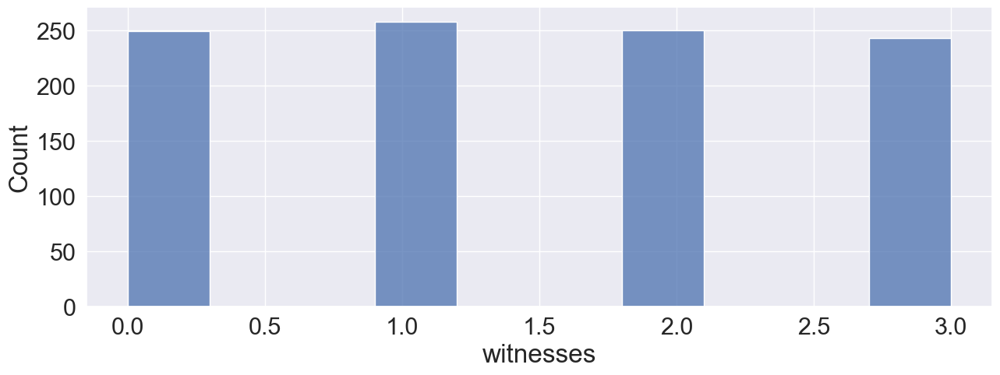

#Histplot for total_claim_amount column
59400    5
2640     4
70400    4
4320     4
44200    4
        ..
65250    1
87100    1
6240     1
66600    1
67500    1
Name: total_claim_amount, Length: 763, dtype: int64


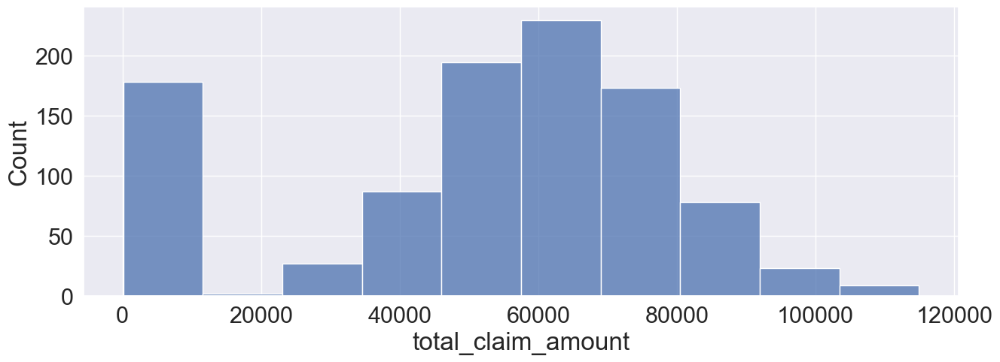

#Histplot for injury_claim column
0        25
640       7
480       7
660       5
580       5
         ..
14840     1
6580      1
11820     1
16650     1
7500      1
Name: injury_claim, Length: 638, dtype: int64


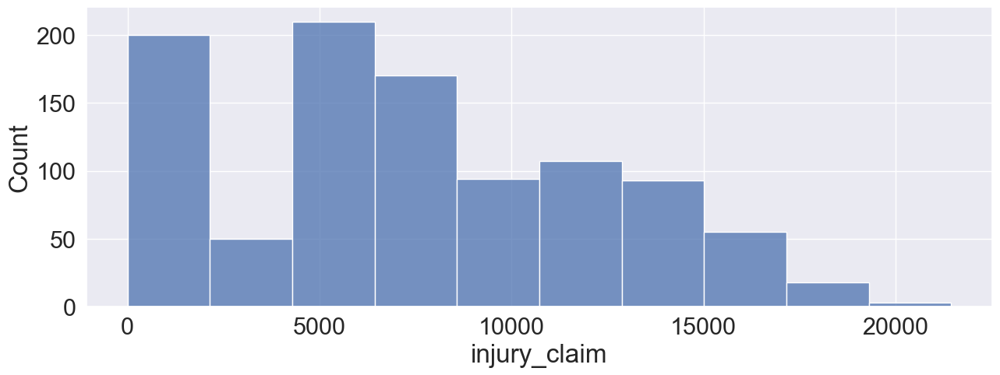

#Histplot for property_claim column
0        19
860       6
480       5
660       5
10000     5
         ..
3590      1
6480      1
4580      1
4920      1
7500      1
Name: property_claim, Length: 626, dtype: int64


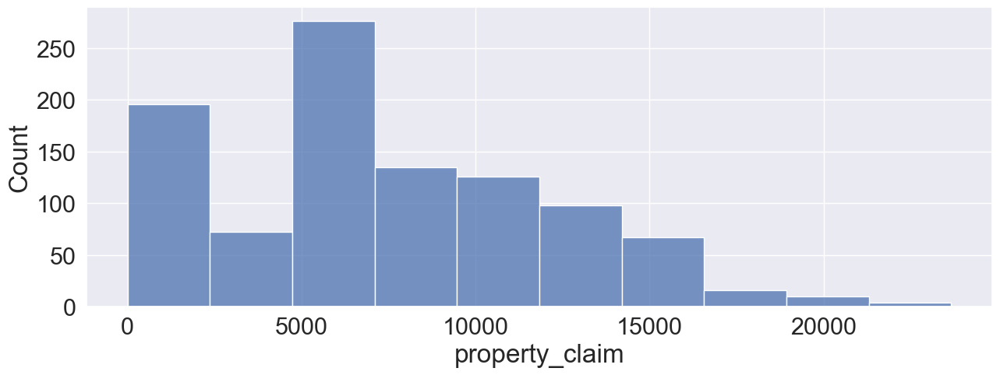

#Histplot for vehicle_claim column
5040     7
3360     6
52080    5
4720     5
3600     5
        ..
43360    1
25130    1
38940    1
47430    1
52500    1
Name: vehicle_claim, Length: 726, dtype: int64


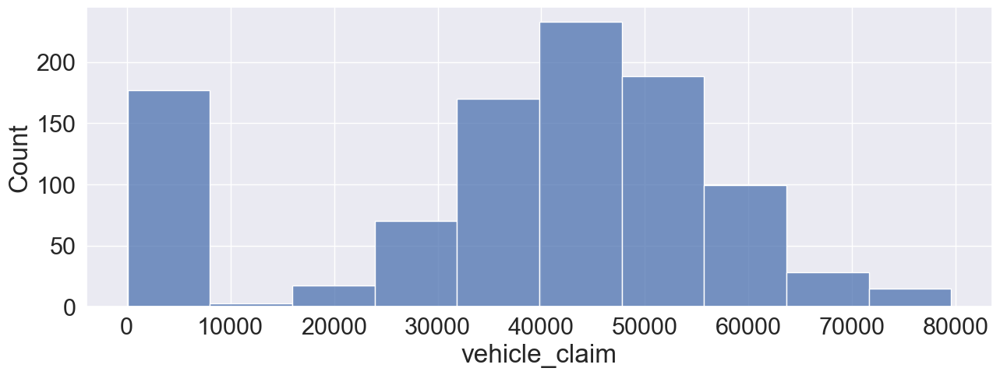

#Histplot for auto_year column
1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype: int64


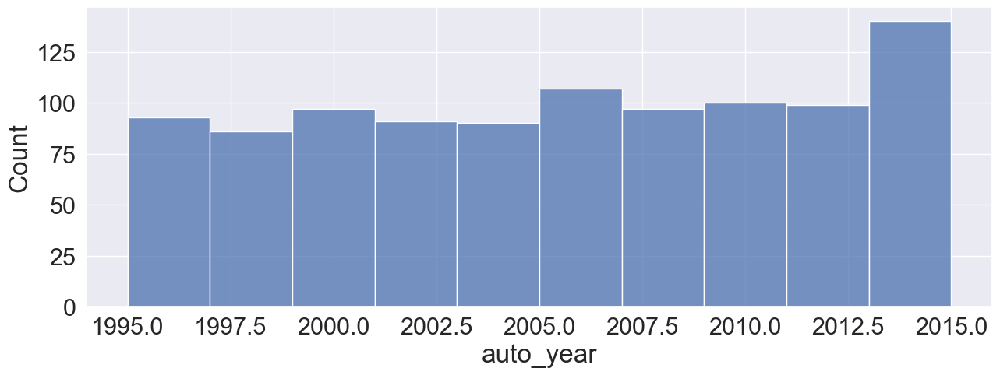

#Histplot for policy_bind_Day column
28    48
12    44
2     44
8     41
18    40
21    40
29    37
3     37
16    37
25    37
1     35
7     35
11    34
20    33
19    33
10    32
15    31
4     31
24    31
14    31
17    30
27    30
5     29
6     28
23    26
30    26
13    24
9     23
22    23
26    19
31    11
Name: policy_bind_Day, dtype: int64


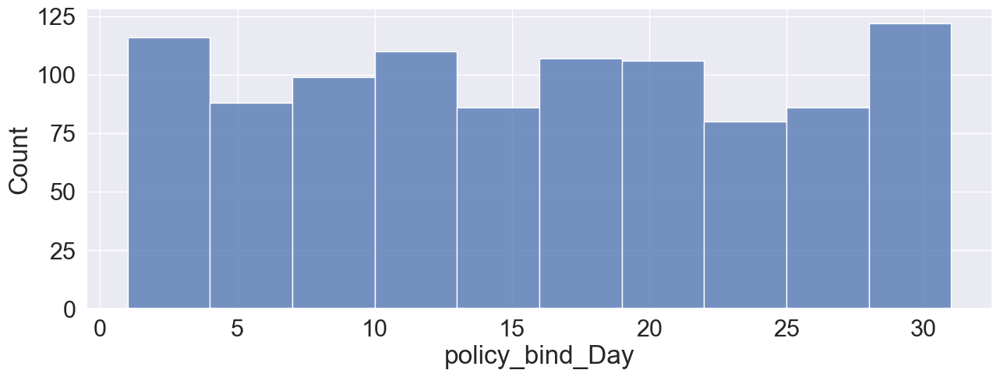

#Histplot for policy_bind_Month column
7     96
11    91
9     87
6     86
4     86
5     84
8     82
1     80
10    79
3     79
12    76
2     74
Name: policy_bind_Month, dtype: int64


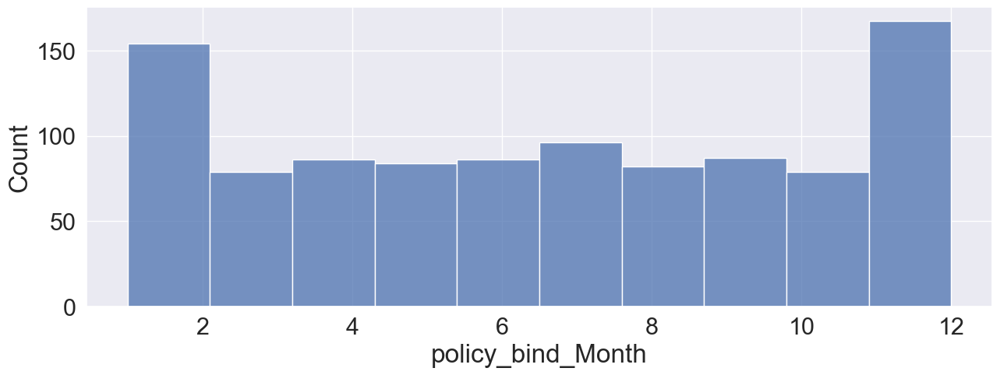

#Histplot for policy_bind_Year column
1991    55
2002    50
1992    48
1990    48
1997    44
2014    43
2009    43
1996    43
2001    41
2006    41
1994    41
2005    40
1999    40
2007    40
1995    39
2010    38
2003    37
2004    36
2012    36
2013    35
2008    33
1993    33
2011    32
2000    31
1998    30
2015     3
Name: policy_bind_Year, dtype: int64


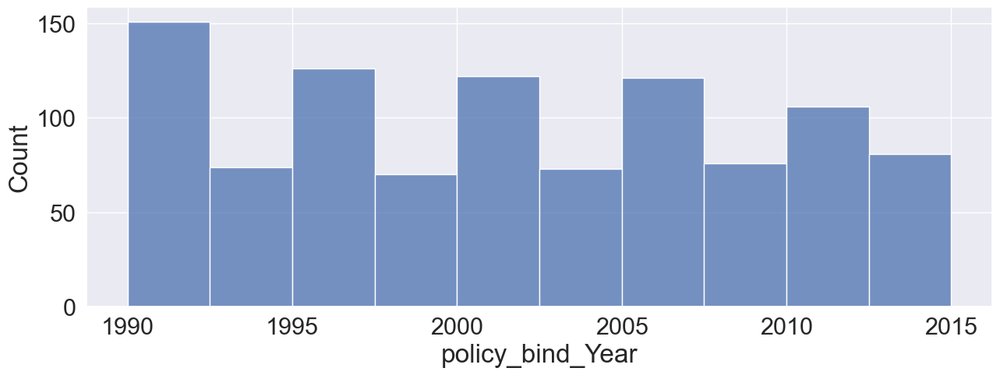

#Histplot for incident_Day column
1     200
2     199
17     41
24     41
21     38
14     37
13     37
22     34
19     33
28     33
18     33
23     32
20     32
16     32
15     31
26     28
25     28
27     27
30     21
31     20
3      12
29     11
Name: incident_Day, dtype: int64


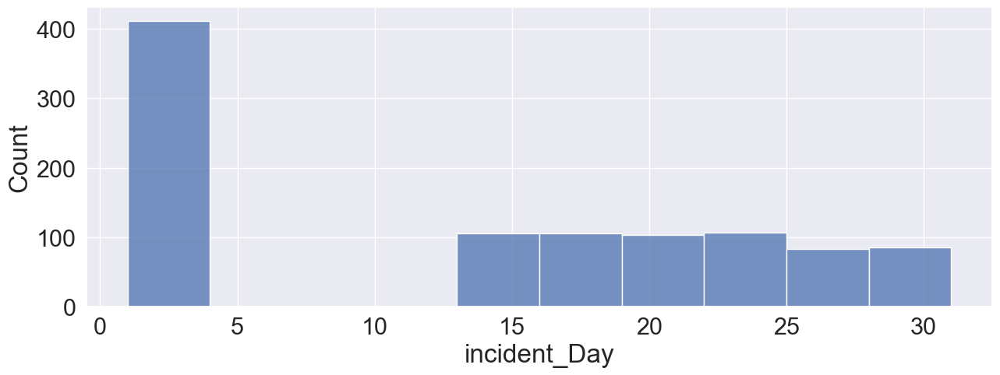

#Histplot for incident_Month column
1     365
2     312
8      39
12     39
6      37
4      36
7      35
10     34
3      31
9      30
5      23
11     19
Name: incident_Month, dtype: int64


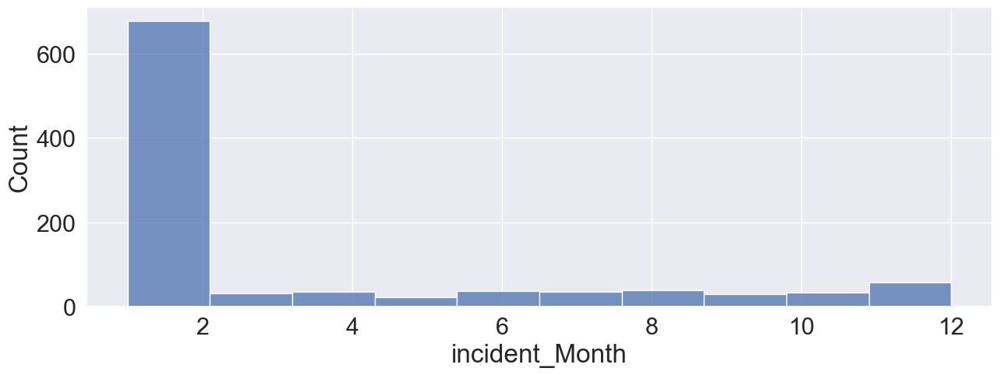

#Histplot for incident_Year column
2015    1000
Name: incident_Year, dtype: int64


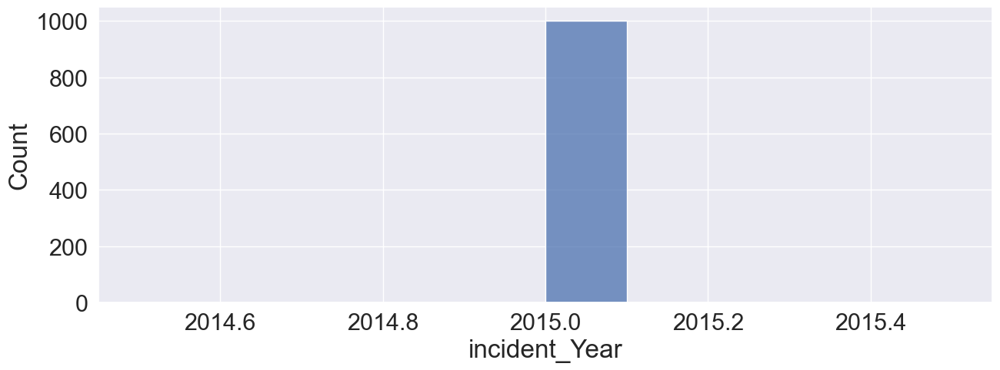

In [50]:
for j in df_n:
    print('#Histplot for', j, 'column')
    print(df_n[j].value_counts())
    plt.figure(figsize=(15, 5))
    sns.histplot(x=j, data=df_n, bins=10) 
    plt.show()
    print('=' * 100)

### Bivariate Analysis

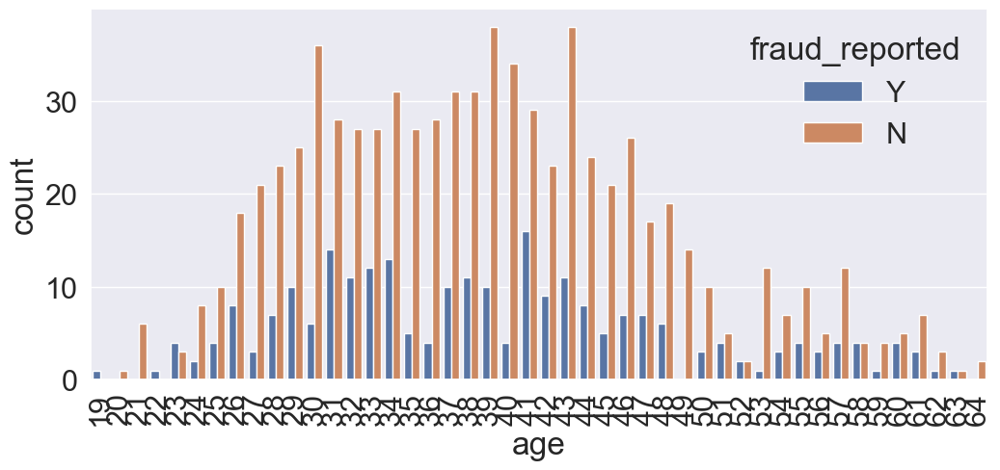

In [51]:
#Count Plot for comparision between "Workclass" column and "Income" column
plt.figure(figsize=(12,5))
sns.countplot("age",data=df, hue='fraud_reported')
plt.xticks(rotation=90)
plt.show()

Double digit category column name: umbrella_limit


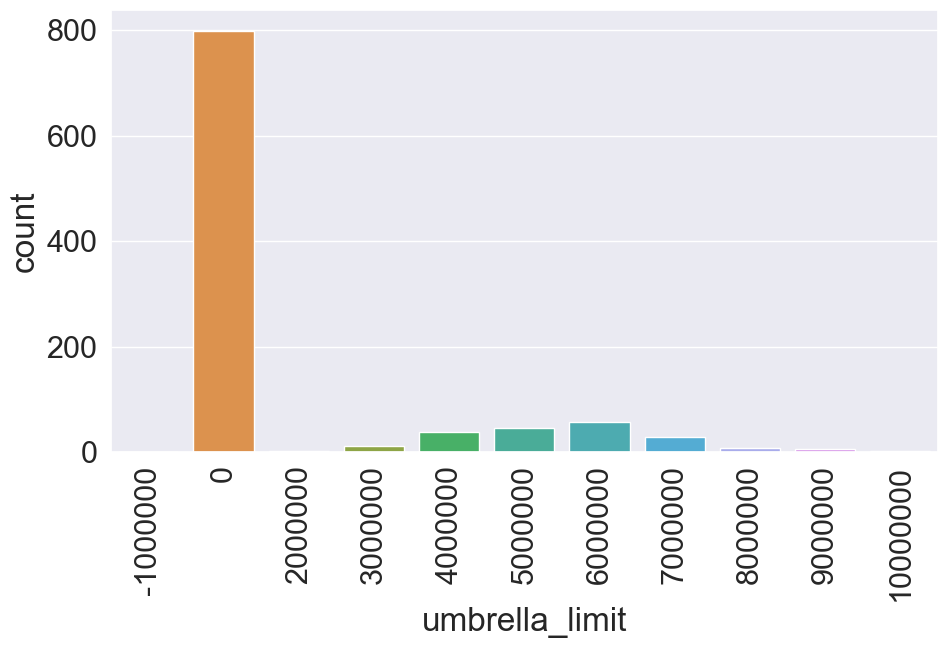

Double digit category column name: insured_occupation


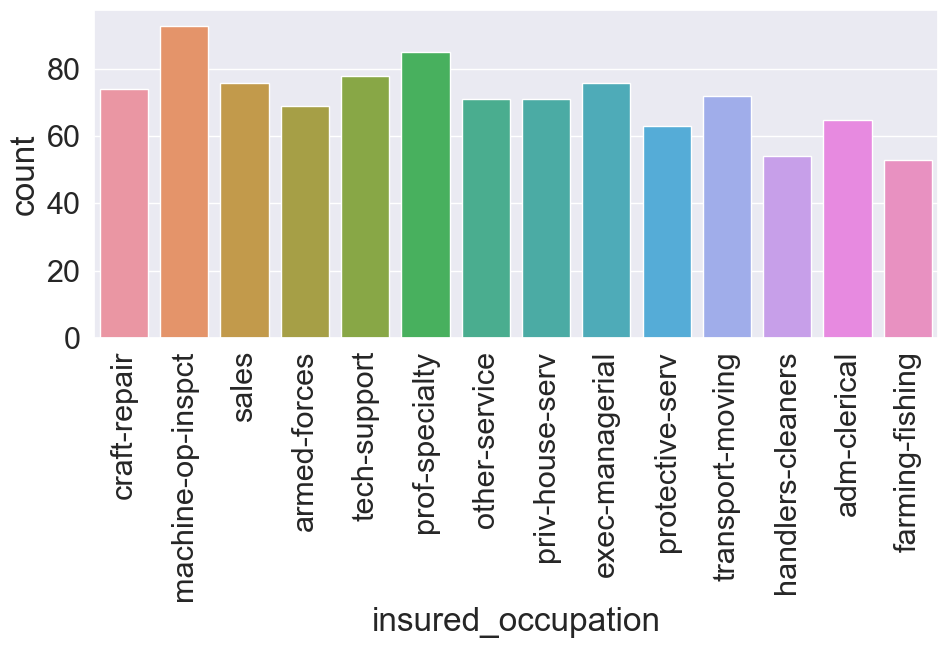

Double digit category column name: auto_make


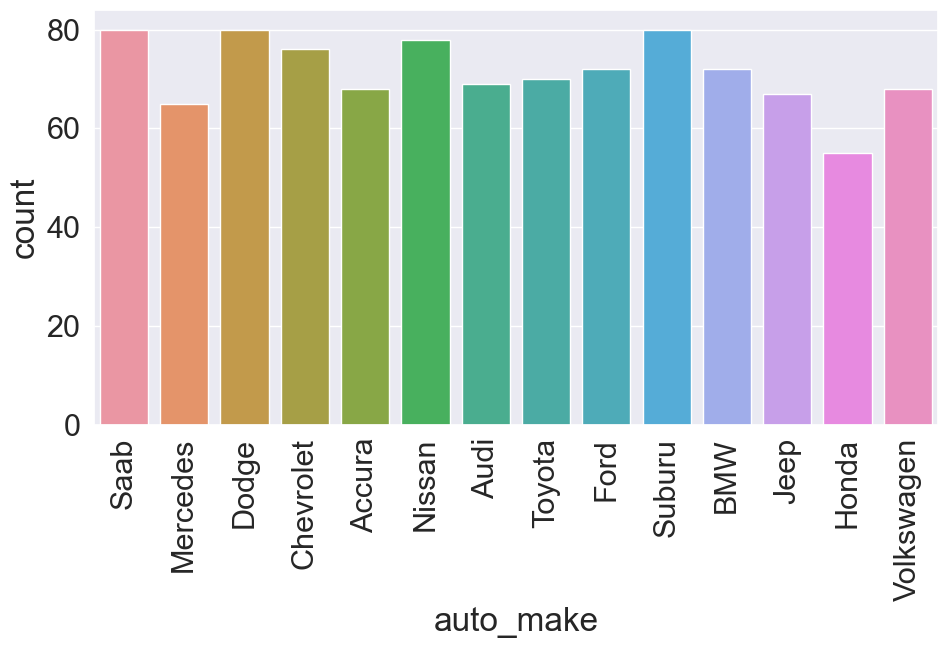

Double digit category column name: insured_hobbies


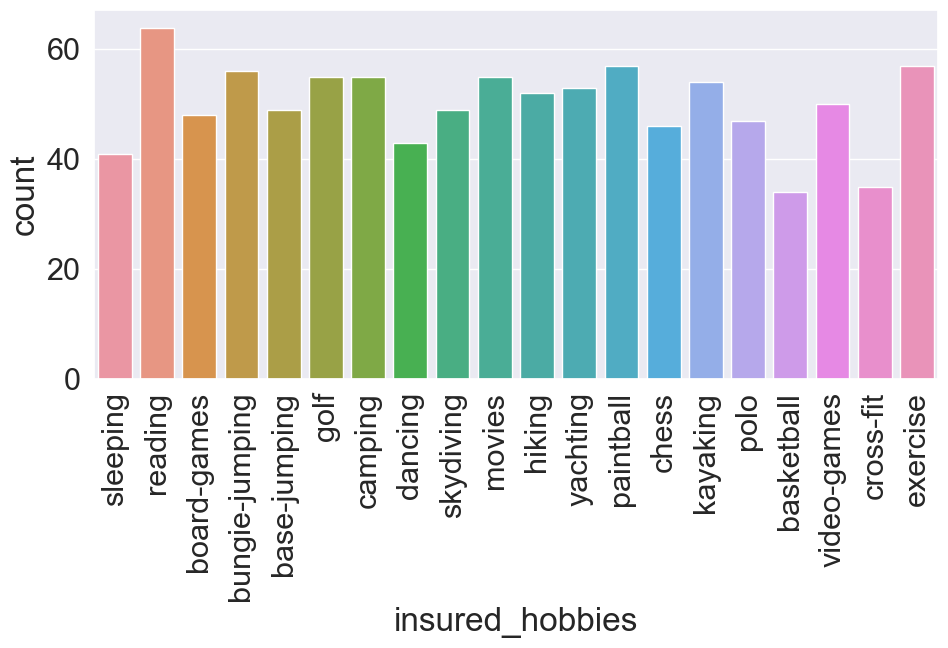

Double digit category column name: auto_model


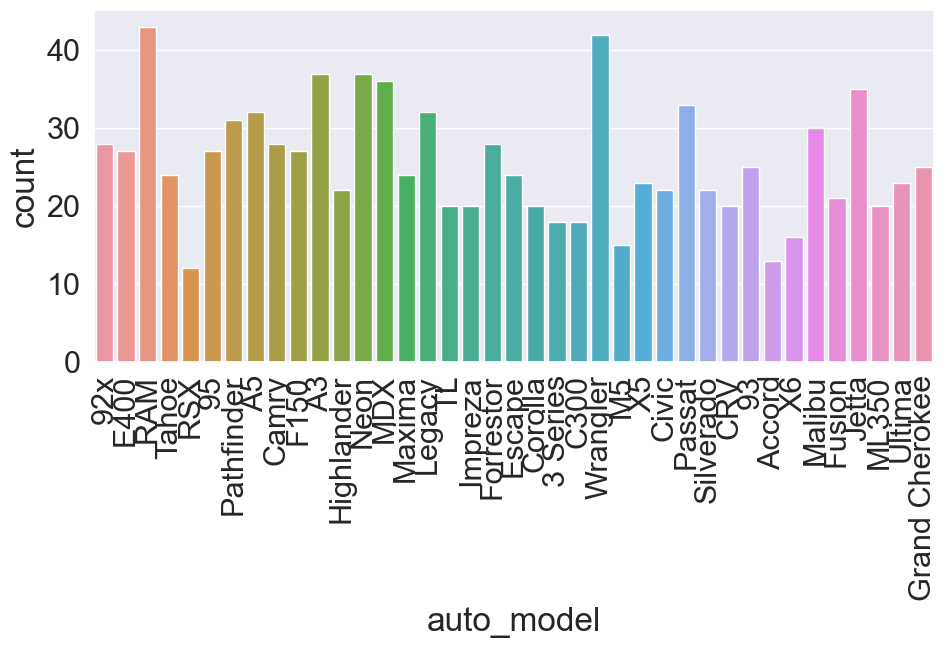

In [52]:
def generate_countplot(x):
    plt.figure(figsize=(10,7))
    sns.countplot(x)
    plt.xticks(rotation=90)
    plt.tight_layout()
    return plt.show()

col2 = ['umbrella_limit', 'insured_occupation', 'auto_make', 'insured_hobbies', 'auto_model']

for j in df[col2]:
    print(f"Double digit category column name:", j)
    generate_countplot(df[j])

In the above count plots we can see the categorical data distribution among the dataset rows covering double digit category in a set number of data points for each value.

My observations:

We see that the umbrella limit is the highest for the number 0 than any other value listed in that column<br>

With respect to occupation of all the insured people we see the highest data coverage by machine operation inspector and professional speciality designations<br>

Taking a look at vehicle companies we see a higher scale of data for saab, dodge, nissan, suburu and volkswagen<br>

The listeing of hobbies held by insured people has the highest data coverage on reading<br>

If we take a look at the vehicle models that were registered for incidents then we see lots of data rows covered by RAM and Wrangler automobile models

## Visualization for Numerical column

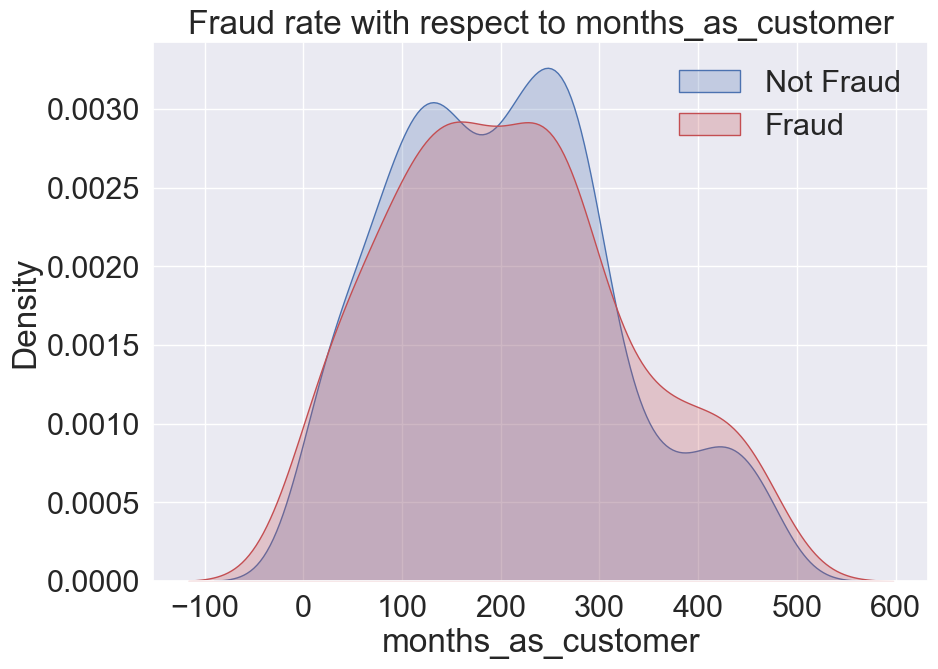

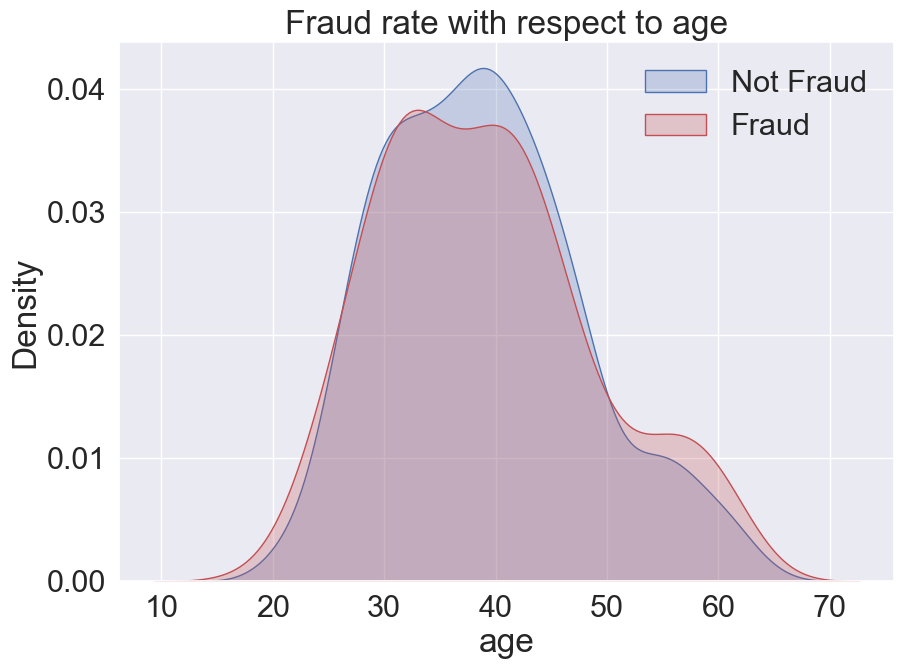

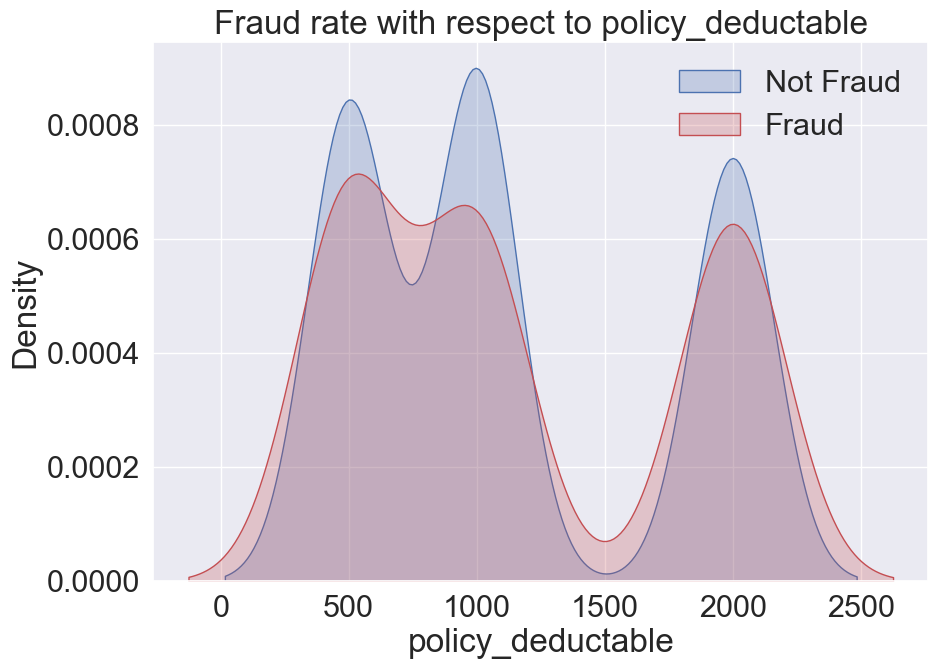

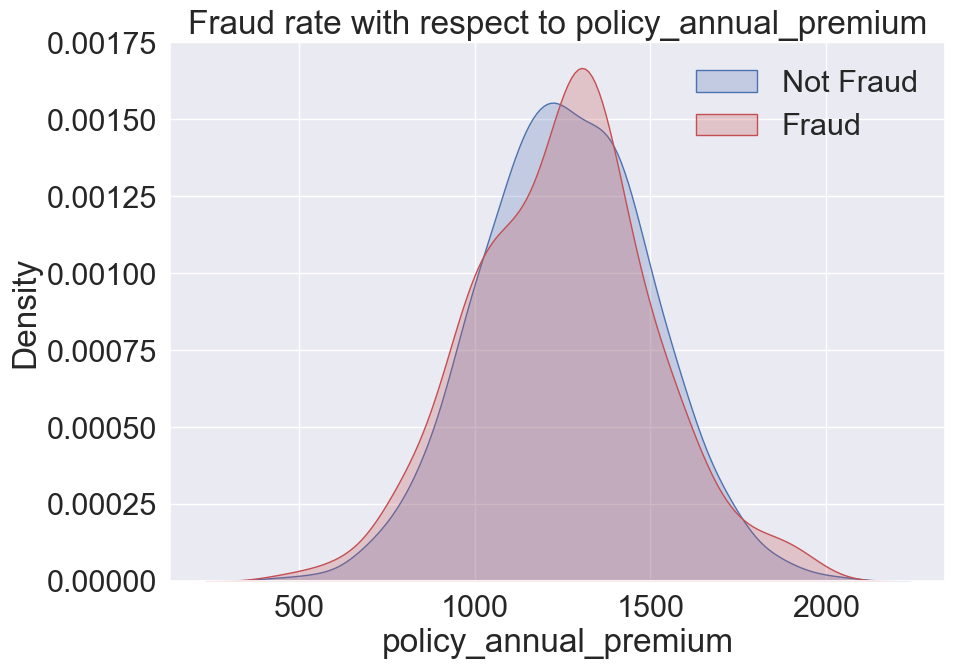

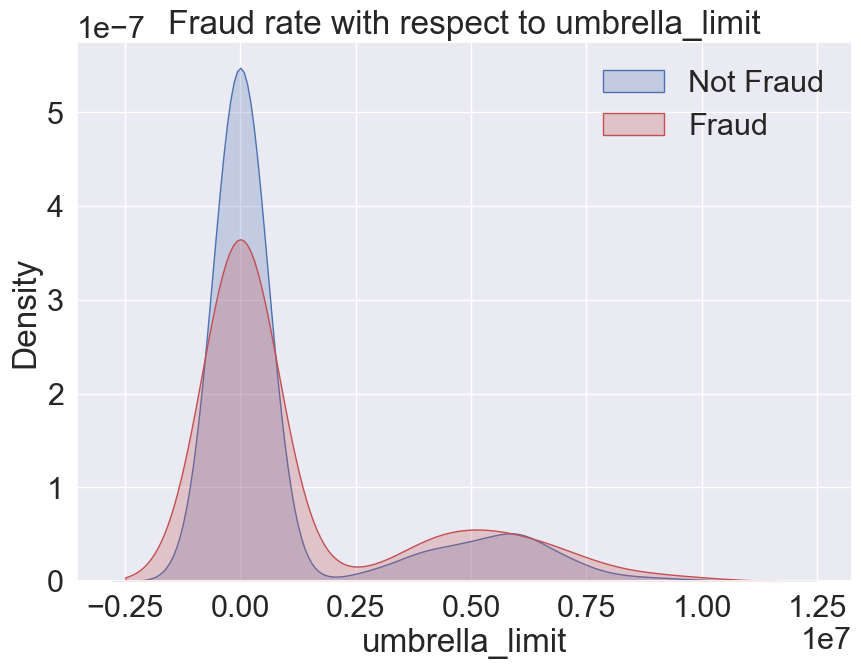

...

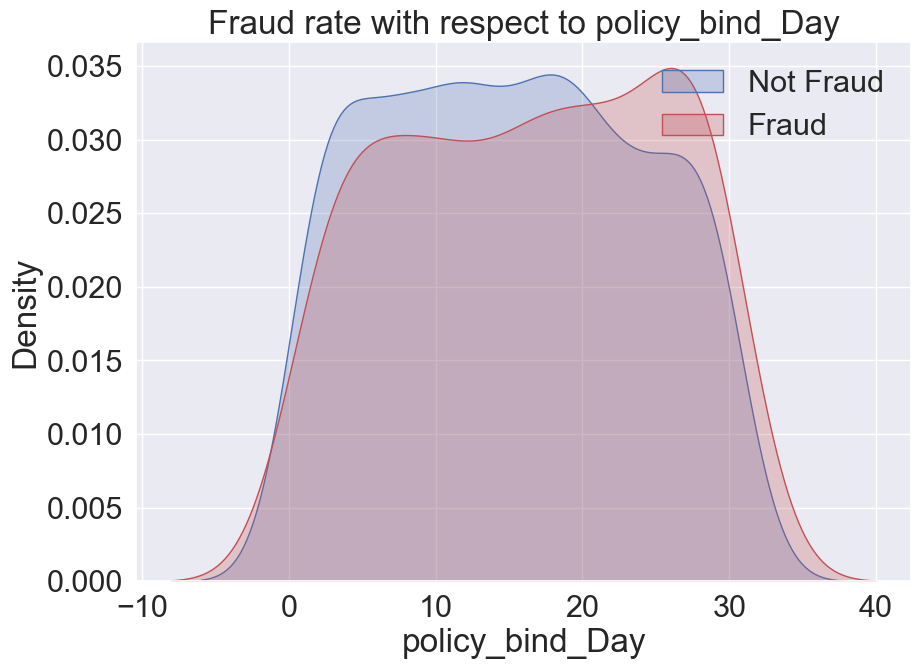

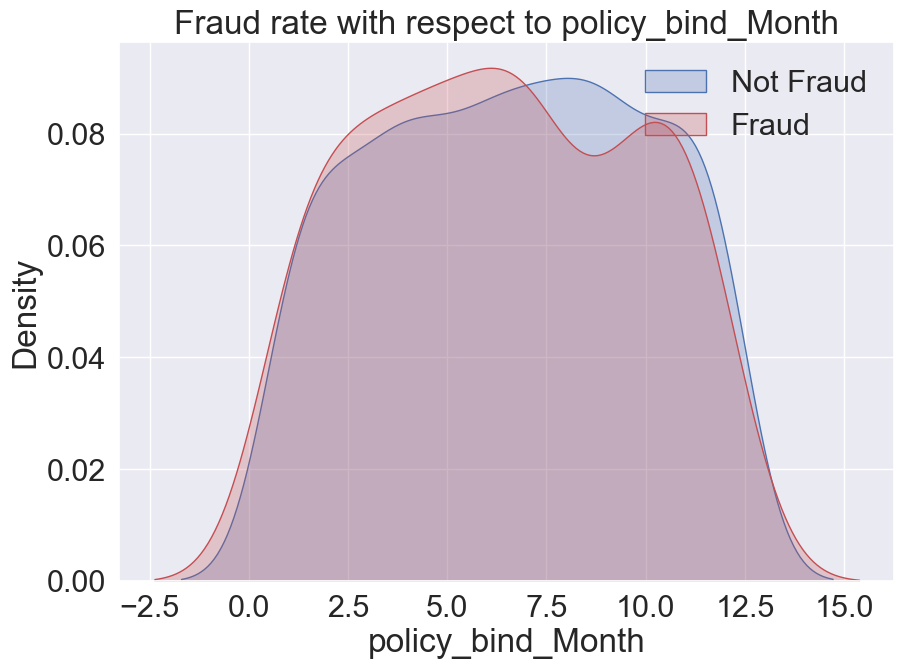

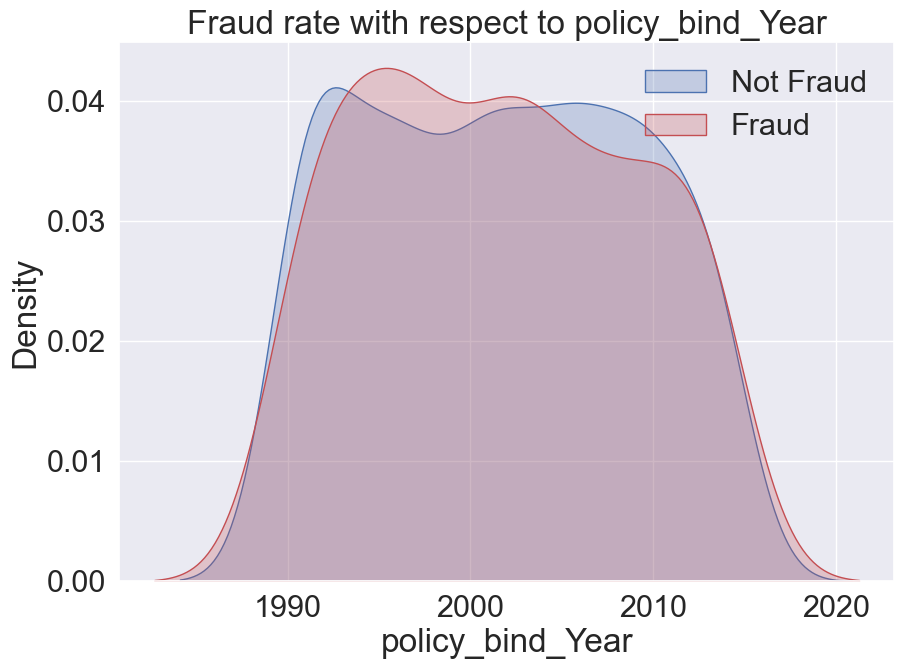

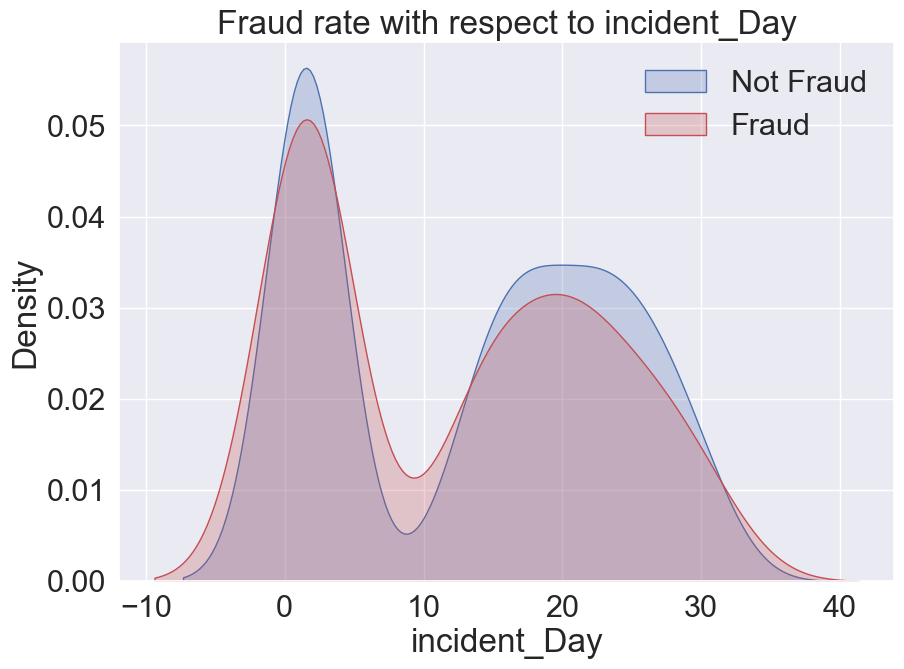

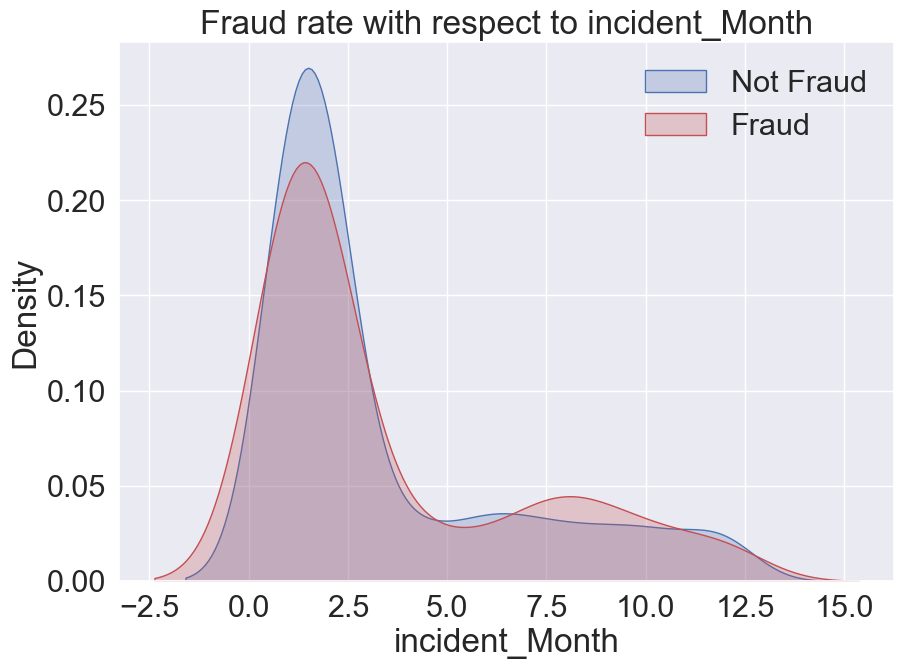

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


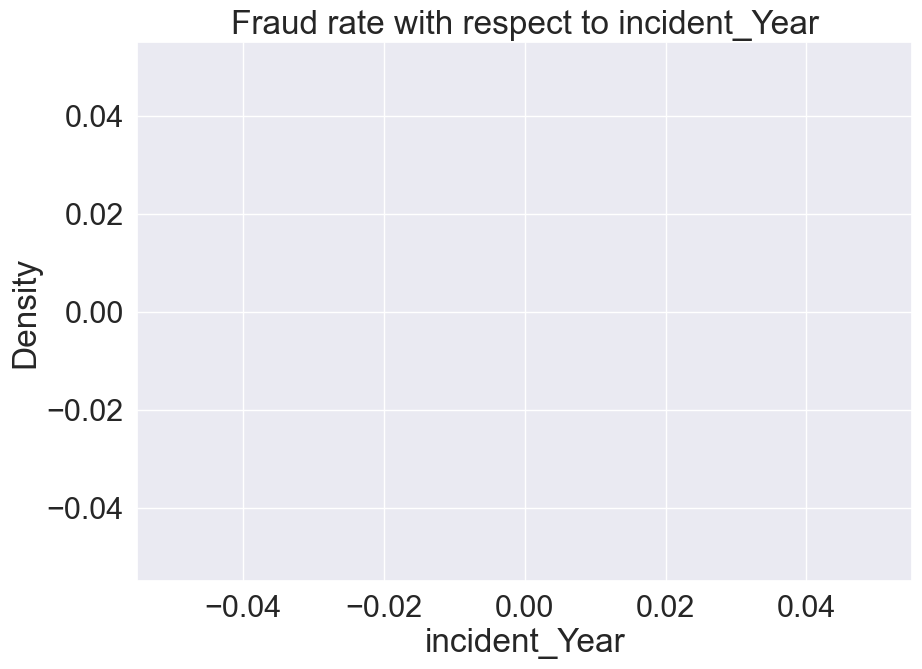

In [53]:
col3 = ['incident_hour_of_the_day', 'age', 'capital-gains', 'capital-loss', 'months_as_customer', 'property_claim',
       'injury_claim', 'vehicle_claim', 'total_claim_amount', 'policy_annual_premium', 'insured_zip']

for z in df[num_cols]:
    fig = plt.figure(figsize=(10,7))
    ax=sns.kdeplot(df.loc[(df['fraud_reported'] == 'N'),z], color='b', shade=True, label='Not Fraud') 
    ax=sns.kdeplot(df.loc[(df['fraud_reported'] == 'Y'),z], color='r', shade=True, label='Fraud')
    plt.title('Fraud rate with respect to {}'.format(z))
    plt.legend()
    plt.show()

Covered visualization on all the columns with respect to our label column.

Label Column: fraud_reported(2)

Less category columns as col1: insured_sex(2) policy_state(3) policy_csl(3) policy_deductable(3) bodily_injuries(3) police_report_available(3) property_damage(3) incident_type(4) collision_type(4) incident_severity(4) number_of_vehicles_involved(4) witnesses(4) authorities_contacted(5) insured_relationship(6) insured_education_level(7) incident_state(7) incident_city(7)

More category columns as col2: umbrella_limit(11) insured_occupation(14) auto_make(14) insured_hobbies(20) auto_model(39)

High unique value numeric columns as col3: incident_hour_of_the_day(24) age(46) capital-gains(338) capital-loss(354) months_as_customer(391) property_claim(626) injury_claim(638) vehicle_claim(726) total_claim_amount(763) policy_annual_premium(991) insured_zip(995)

### Multivariate analysis

<Figure size 2000x2000 with 0 Axes>

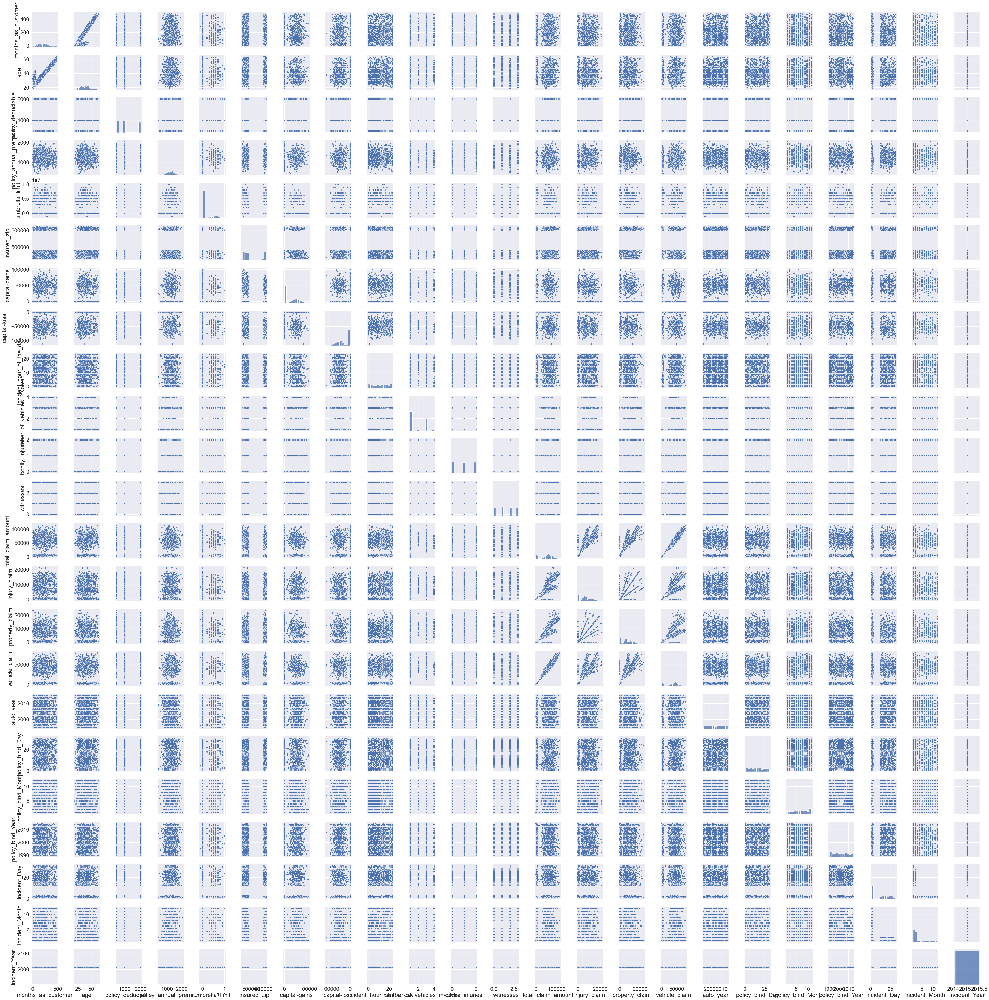

In [54]:
plt.figure(figsize= (20,20))
sns.pairplot(data= df)
plt.show()

#### Let us take the columns which are not that insightful and modify them which provides good insight for the data analysis.

### Distribution Plots

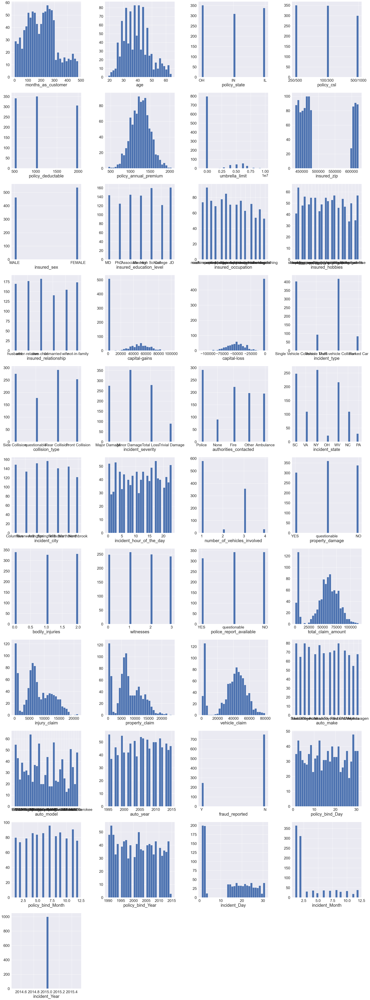

In [55]:
plt.figure(figsize=(30,80))
plotnumber=1

for column in df:
    if plotnumber<=41:
        ax = plt.subplot(11,4,plotnumber)
        plt.hist(df[column],bins=30)
        plt.xlabel(column,fontsize=25)
        
        
        plotnumber+=1
plt.tight_layout()    

<font size=5>**Encoding the categorical object datatype columns**

## Label Encoding

In [56]:
cat_cols

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [57]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df[cat_cols]=df[cat_cols].apply(le.fit_transform)

In [58]:
df.head(5)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,2,1,1000,1406.91,0,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1,17,10,2014,25,1,2015
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,6,15,2,0,0,3,3,1,4,5,5,8,1,2,0,0,2,5070,780,780,3510,8,12,2007,1,27,6,2006,21,1,2015
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0,9,6,2000,22,2,2015
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,2,1,2,0,63400,6340,6340,50720,3,34,2014,1,25,5,1990,1,10,2015
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,11,2,4,66000,-46000,3,3,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,2009,0,6,6,2014,17,2,2015


all the categorial column has been changed into Numerical column

In [59]:
print(f"Shape of our data frame post encoding is", df.shape)
df.isnull().sum()

Shape of our data frame post encoding is (1000, 41)


months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_cl

With the help of shape and isnull method I am taking a look at our data frame values post applying the encoding technique on them. We see that there are no null values present in any of the columns above.

### Correlation

In [60]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,0.060925,-0.000833,0.009814,-0.093661,0.069727,0.006399,0.020209,-0.017377,-0.082966,-0.059581,0.010021,0.005369,-0.000130,0.070639,0.014736,-0.004631,-0.010162,0.058383,-0.071746,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,0.051728,0.005750,-0.048276,-0.011092,0.024659,NaN
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.007075,0.007368,-0.025626,-0.086068,-0.058439,0.015417,0.005770,-0.002291,0.087161,0.022102,-0.002733,-0.015679,0.052359,-0.063040,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,0.053869,0.015501,-0.037444,-0.006131,0.023404,NaN
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074551,-0.030338,0.031848,0.037564,-0.026377,-0.016777,0.008723,-0.002077,0.029457,-0.042263,-0.030719,0.013384,0.022960,-0.024713,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,0.002277,0.071450,-0.007276,0.014745,0.023643,NaN
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.005249,-0.034612,0.011997,0.065861,0.022530,0.056182,0.032814,0.009333,-0.001869,-0.019403,0.007561,-0.000595,0.071500,-0.007507,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.018973,-0.045345,-0.016466,-0.004156,-0.011794,NaN
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.035212,-0.023544,-0.038411,-0.041188,-0.015711,-0.000760,0.006517,-0.045117,0.060935,0.051214,-0.006837,-0.022765,0.066639,0.004936,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.009164,-0.050416,-0.049598,-0.018160,-0.006418,NaN
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,0.038853,-0.019715,0.035922,-0.018019,0.001925,-0.013738,0.023547,0.053603,0.013508,-0.011155,-0.055191,0.046434,0.048724,-0.001578,-0.045991,-0.052172,0.026780,0.002332,0.010332,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.025183,-0.035355,0.001249,0.014835,0.021559,NaN
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,0.010688,-0.019357,0.023422,-0.037000,0.077495,-0.047268,-0.024056,0.015966,0.040219,0.009466,0.029044,-0.077492,0.013094,-0.023257,-0.021270,-0.015237,0.022743,-0.006738,0.034177,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,-0.045207,0.009961,0.048008,-0.021716,0.042409,NaN
insured_zip,0.017895,0.025604,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,-0.036942,0.016079,-0.069077,0.002106,-0.002355,0.006303,0.049372,-0.010840,0.022519,-0.023855,-0.017548,-0.047669,-0.017532,0.008274,0.027448,-0.077921,0.028695,0.019805,0.050983,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368,-0.039867,0.015864,-0.001100,0.019095,0.005461,NaN
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,-0.036942,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.020494,-0.021705,0.009952,0.003799,-0.028168,0.0

This gives the correlation between the dependent and independent variables.

In [61]:
df.corr()['fraud_reported'].sort_values()

incident_severity             -0.405988
collision_type                -0.135725
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_Day                  -0.044151
incident_city                 -0.040403
policy_csl                    -0.037190
policy_bind_Month             -0.030829
auto_make                     -0.027519
capital-gains                 -0.019173
capital-loss                  -0.014863
policy_annual_premium         -0.014480
policy_bind_Year              -0.000059
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
police_report_available        0.008399
insured_education_level        0.008808
age                            0.012143
incident_Month                 0.014495
policy_deductable              0.014817
insured_zip                    0.019368


##### We can observe :

- All columns are sorted in ascending order showing least to strong correlation with target column.
- 15 columns are negatively correlated and 25 columns are positively correlated.
- Column 'vehicle_claim' is highly correlated with Target column and Column 'incident_severity' is least correlated with Target column
-remove "incident_Year" which is giving NaN value

In [62]:
df.drop("incident_Year",axis=1, inplace=True)

## Visualizing the correlation matrix by plotting heat map.

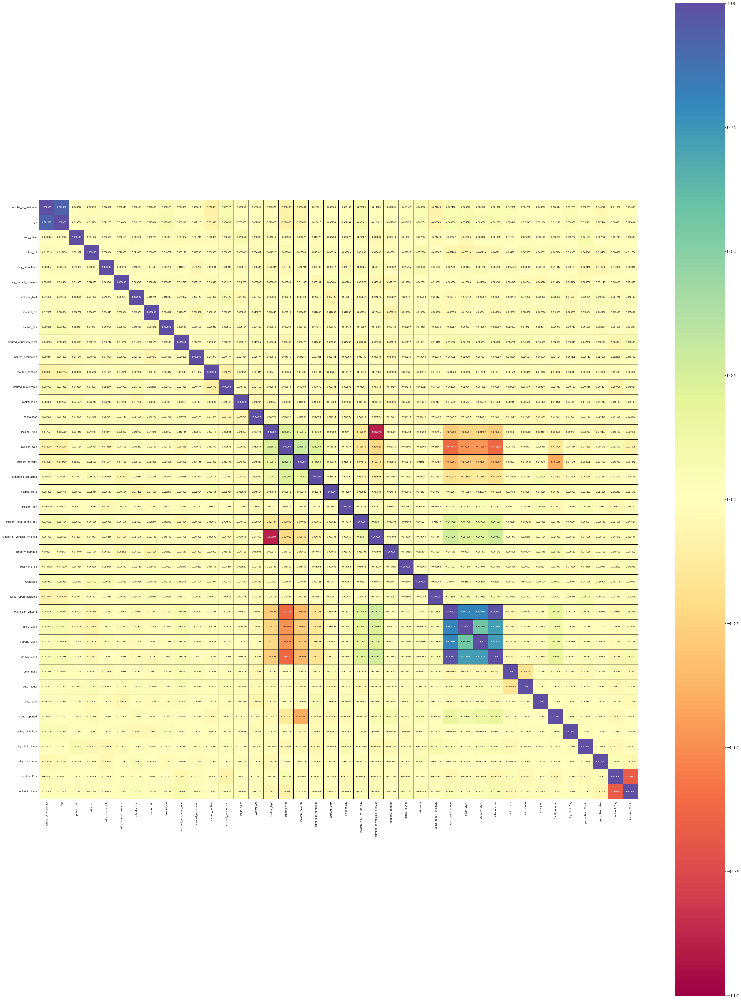

In [63]:
lower_triangle = np.tril(df.corr())
plt.figure(figsize=(60,80))
sns.heatmap(df.corr(),linewidths=.1,linecolor='black', vmin=-1, vmax=1, annot=True, square=True, fmt='f', 
            annot_kws={'size':10}, cmap="Spectral")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In the above heatmap we are not able to see the correlation details details but we can make out that there are few columns which are multicollinear. However they seem to add weightage over the label prediction therefore we shall retain them all.

#### Checking correlation with barplot

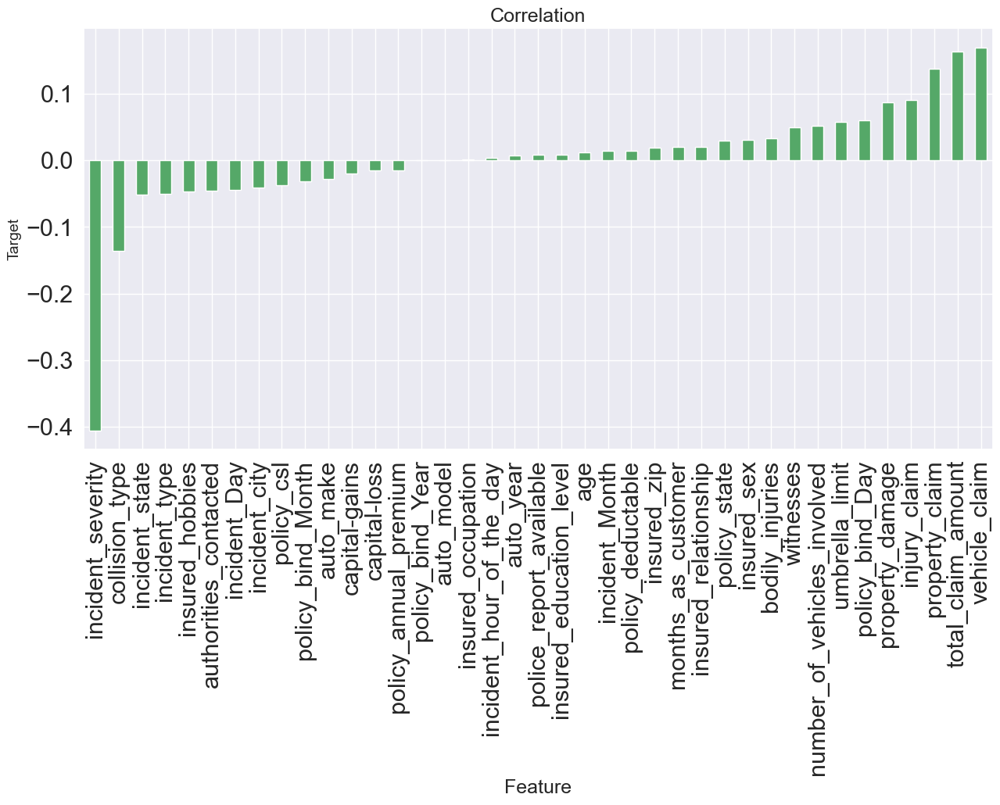

In [64]:
plt.figure(figsize=(15,7))
df.corr()['fraud_reported'].sort_values(ascending=True).drop(['fraud_reported']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

##### Outcome:
- Here we can see "auto_year" is least correletaed with Target Column and "incident_severity" is highly but negatively correletaed with Target Column. 
- So, Least correlated is "incident_severity" and Highly correlated is "vehicle_claim" with target column.

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int32  
 3   policy_csl                   1000 non-null   int32  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   int32  
 9   insured_education_level      1000 non-null   int32  
 10  insured_occupation           1000 non-null   int32  
 11  insured_hobbies              1000 non-null   int32  
 12  insured_relationship         1000 non-null   int32  
 13  capital-gains      

## Checking Outliers

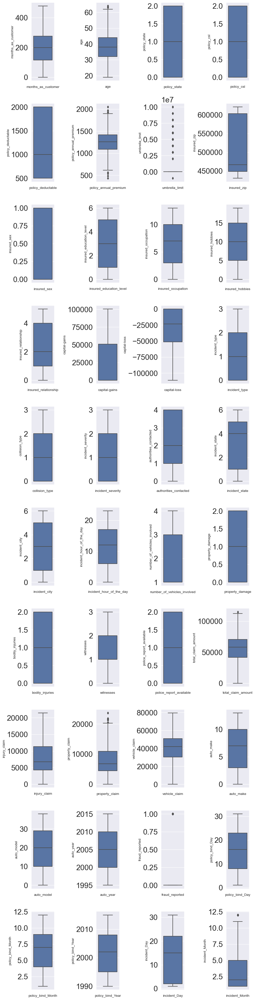

In [66]:
plt.figure(figsize=(10, 40), facecolor='white')
plotnumber = 1

for column in df.columns:
    if plotnumber <= 40:
        ax = plt.subplot(10, 4, plotnumber)
        sns.boxplot(y=column, data=df)
        plt.xlabel(column, fontsize=10)
        plt.ylabel(column, fontsize=10) 
    plotnumber += 1

plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()


With the help of boxen plot we can see the outlier details present in our numerical data columns which will need to be treated.

### Removing Outliers using Zscore

In [67]:
from scipy.stats import zscore
z=np.abs(zscore(df))
thershold=3
df_new=df[(z<3).all(axis=1)]
df_new.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,2,1,1000,1406.91,0,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1,17,10,2014,25,1
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,6,15,2,0,0,3,3,1,4,5,5,8,1,2,0,0,2,5070,780,780,3510,8,12,2007,1,27,6,2006,21,1
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0,9,6,2000,22,2
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,2,1,2,0,63400,6340,6340,50720,3,34,2014,1,25,5,1990,1,10
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,11,2,4,66000,-46000,3,3,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,2009,0,6,6,2014,17,2


In [68]:
z.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,1.078140,0.990836,1.187173,0.060937,0.222383,0.616705,0.479476,0.489529,1.076953,0.530931,1.158316,1.281737,1.437957,1.011331,0.953851,0.766005,0.593292,1.260614,1.196963,0.351762,0.962196,0.956261,0.823865,0.026342,0.009759,0.461838,0.000000,0.714257,0.189283,1.165505,0.749653,0.856466,1.645743,0.183440,1.746019,0.175451,1.015026,1.684992,1.141603,0.735040
1,0.208995,0.334073,0.016856,0.060937,1.412784,0.242521,1.697980,0.461008,1.076953,0.530931,0.162558,0.929078,0.247595,0.901927,0.953851,1.691132,1.547138,0.195906,1.196963,0.815829,0.995476,0.524475,0.823865,1.171013,1.210174,1.338700,1.207363,1.807312,1.363822,1.372696,1.823346,0.360539,0.657470,0.315491,1.746019,1.305938,0.164894,0.597550,0.758386,0.735040
2,0.608002,1.088913,1.187173,1.182668,1.412784,0.642233,1.697980,0.984885,0.928546,1.557877,1.082141,1.363201,0.347586,0.358023,0.953851,1.084249,0.360554,0.195906,1.196963,1.040437,0.962196,0.668404,1.140056,1.223697,1.229693,1.362107,1.207363,0.686362,0.054644,0.736072,0.785565,0.631315,0.959702,0.315491,0.572731,0.728938,0.164894,0.218032,0.854190,0.429664
3,0.452355,0.224613,1.220886,0.060937,1.412784,0.652886,2.133471,1.491682,0.928546,1.557877,1.407256,1.363201,0.942766,0.853388,1.267577,0.766005,1.314400,1.260614,1.196963,0.576371,1.451614,0.956261,0.823865,1.171013,0.009759,0.461838,1.207363,0.403135,0.224130,0.219722,0.677607,0.879279,1.319074,1.479664,1.746019,1.079841,0.459874,1.577335,1.157698,2.013343
4,0.208995,0.552994,1.220886,1.304542,0.222383,1.341980,2.133471,1.527808,1.076953,1.522961,1.082141,1.363201,0.942766,1.467210,0.683741,1.691132,1.547138,0.195906,0.109052,1.040437,1.451614,1.202666,0.823865,1.223697,1.210174,0.438431,1.207363,1.753121,1.257232,1.399654,1.768252,1.623169,1.049545,0.648112,0.572731,1.068084,0.164894,1.684992,0.375169,0.429664


In [69]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("New DataFrame data in Rows and Column:",df_new.shape)
print("Total Dropped rows:",df.shape[0]-df_new.shape[0])
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df_new.shape[0])/df.shape[0]*100)

Old DataFrame data in Rows and Column: (1000, 40)
New DataFrame data in Rows and Column: (980, 40)
Total Dropped rows: 20
Percentage of data loss post outlier removal:  2.0


### Percentage Data Loss using Zscore is 2%  so acceptable

Data loss can be bearable

## Checking for the skewness

In [70]:
df_new.skew().sort_values()

vehicle_claim                 -0.620936
total_claim_amount            -0.593593
capital-loss                  -0.376884
incident_state                -0.149255
authorities_contacted         -0.114044
auto_model                    -0.073462
insured_hobbies               -0.061488
insured_occupation            -0.055360
auto_year                     -0.054522
property_damage               -0.042133
incident_hour_of_the_day      -0.039280
policy_state                  -0.038157
auto_make                     -0.028739
policy_bind_Month             -0.024643
bodily_injuries                0.003757
insured_education_level        0.006286
police_report_available        0.009507
witnesses                      0.026211
policy_bind_Day                0.028152
policy_annual_premium          0.035964
incident_city                  0.043882
incident_Day                   0.055443
policy_bind_Year               0.065022
insured_relationship           0.078339
incident_type                  0.090563


In [71]:
cat_cols

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [72]:
num_cols

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month',
 'incident_Year']

### Observation:
- Skewness threshold taken is +/-0.50
- Columns which are having skewness: insured_zip,fraud_reported,incident_Month,umbrella_limit.
- The "vehicle_claim" column data is negatively highly skewed and "umbrella_limit" is positively highly skewed
- All the columns are not normallly distributed, they are skewed.
- Since "fraud_reported" is Target Column so we will not remove skewness. 
- Only we will remove skewness from insured_zip,incident_Month,umbrella_limit as this column contains continuous data.

### Checking skweness through Data Visualization

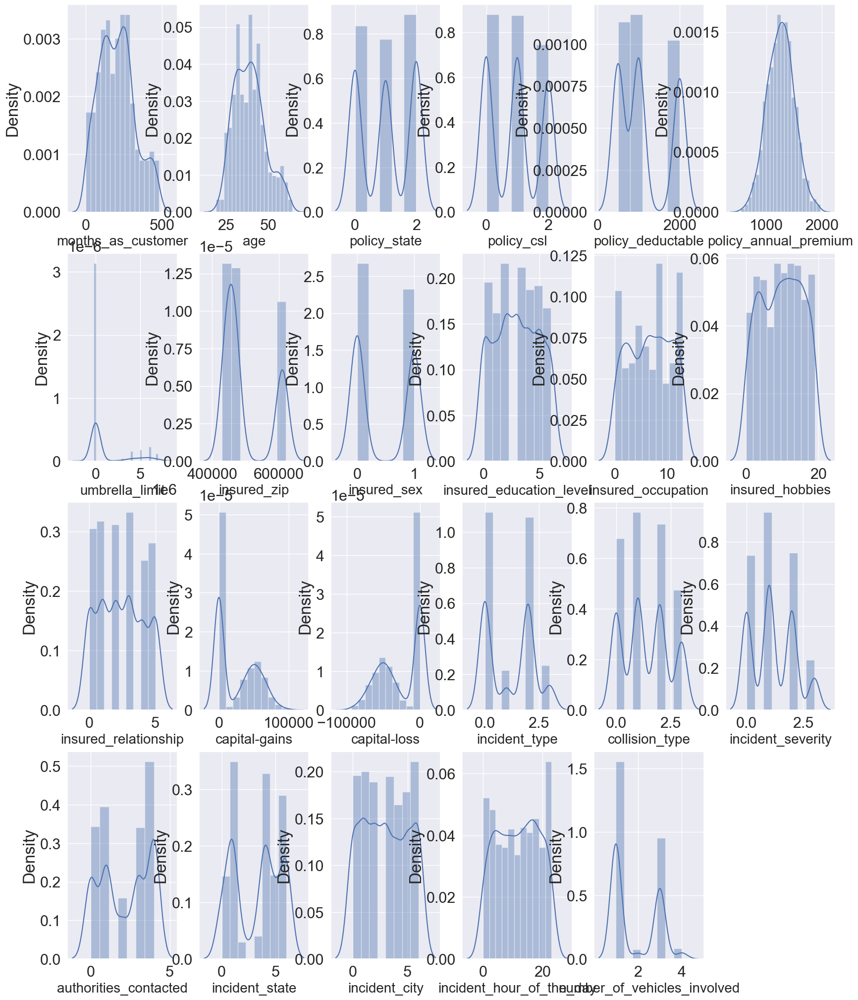

In [73]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df_new:
    if plotnumber<=23:
        ax = plt.subplot(4,6,plotnumber)
        sns.distplot(df_new[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

### Data visualization of skewed continuous column using distplot

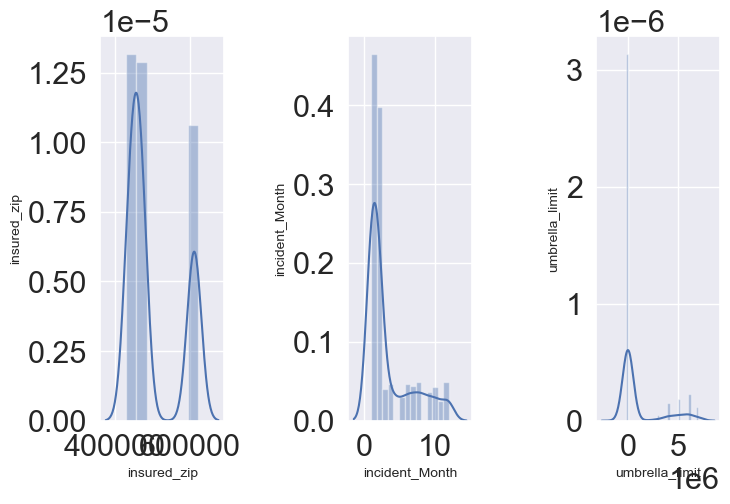

In [74]:
collist=["insured_zip","incident_Month","umbrella_limit"]
plt.figure(figsize=(8,5), facecolor='white')
plotnumber = 1

for column in df_new[collist]:
    if plotnumber<=3:
        ax = plt.subplot(1,3,plotnumber)
        sns.distplot(df_new[column])
        plt.xlabel(column,fontsize=10)
        plt.ylabel(column,fontsize=10)
    plotnumber+=1
plt.subplots_adjust(wspace=1)
plt.show()

### Removing skewnes

In [75]:
from sklearn.preprocessing import PowerTransformer

In [76]:
collist=["insured_zip","incident_Month","umbrella_limit"]
pt = PowerTransformer(method='yeo-johnson')
df_new[collist] = pt.fit_transform(df_new[collist])
df_new[collist]

,insured_zip,incident_Month,umbrella_limit
0,0.0,-1.100637,-0.337086
1,0.0,-1.100637,1.482455
2,0.0,-0.021968,1.482455
3,0.0,1.557258,1.788485
4,0.0,-0.021968,1.788485
...,...,...,...
995,0.0,-0.021968,-0.337086
996,0.0,-1.100637,-0.337086
997,0.0,-1.100637,0.839984
998,0.0,-0.021968,1.482455


### checking skewness after removal

In [77]:
df_new.skew().sort_values()

umbrella_limit                -7.932397
vehicle_claim                 -0.620936
total_claim_amount            -0.593593
capital-loss                  -0.376884
incident_state                -0.149255
authorities_contacted         -0.114044
auto_model                    -0.073462
insured_hobbies               -0.061488
insured_occupation            -0.055360
auto_year                     -0.054522
property_damage               -0.042133
incident_hour_of_the_day      -0.039280
policy_state                  -0.038157
auto_make                     -0.028739
policy_bind_Month             -0.024643
insured_zip                    0.000000
bodily_injuries                0.003757
insured_education_level        0.006286
police_report_available        0.009507
witnesses                      0.026211
policy_bind_Day                0.028152
policy_annual_premium          0.035964
incident_city                  0.043882
incident_Day                   0.055443
policy_bind_Year               0.065022


In [78]:
df_new.drop('umbrella_limit', axis=1, inplace=True)

The data is not normal but the skewness has got removed compared to the old data.

### Separating the features and label variables into x and y

In [79]:
x=df_new.drop('fraud_reported',axis=1)
y=df_new["fraud_reported"]

In [80]:
x.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'insured_zip',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year',
       'incident_Day', 'incident_Month'],
      dtype='object')

In [81]:
x.shape,y.shape

((980, 38), (980,))

In [82]:
y.value_counts()

0    740
1    240
Name: fraud_reported, dtype: int64

The data is not balanced. So, we will use oversampling method to balance it.

## Oversampling using the SMOTE

In [83]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [84]:
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [85]:
y.value_counts()

1    740
0    740
Name: fraud_reported, dtype: int64

After using oversampling method, we check that now our data is balanced.

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

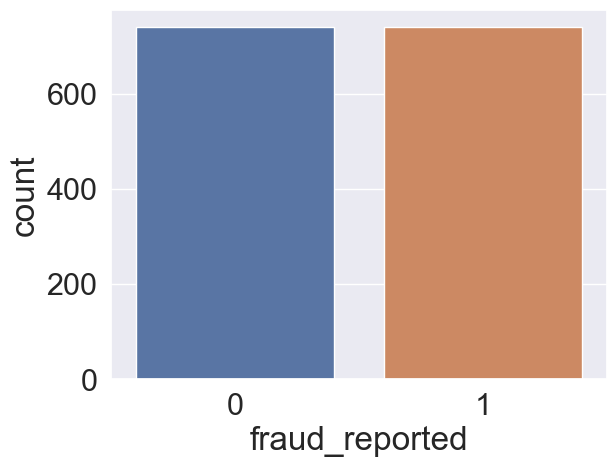

In [86]:
#checking through visualization also
sns.countplot(y)

Now, our data is balanced.

## Scaling data using Standard Scaler

In [87]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [88]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,1.143741,1.075225,1.356516,0.236775,-0.250971,0.647645,0.0,1.245682,0.638242,-1.144571,1.413487,-1.443060,1.043768,0.992417,0.929537,0.803868,-0.947094,1.354890,0.470922,-0.945963,-0.998483,-0.822169,0.055761,0.136328,0.595481,0.134018,0.658689,-0.250371,1.125387,0.690739,0.979182,-1.753948,-0.196698,0.166775,1.129662,1.780507,1.285429,-1.184850
1,0.224814,0.379814,0.087462,0.236775,1.461682,-0.264050,0.0,1.245682,0.638242,-0.095351,1.042111,-0.176317,-0.889834,0.992417,1.905220,1.783066,0.125361,1.354890,0.968754,1.130456,-0.538362,-0.822169,1.325385,-1.124702,-1.330884,1.389375,-2.019911,-1.486304,-1.498915,-2.042414,0.450570,-0.696186,0.337454,1.354583,-0.109471,0.631981,0.876940,-1.184850
2,-0.638977,-1.126911,1.356516,-1.065929,1.461682,0.674732,0.0,-0.802773,1.727115,1.216173,-1.371833,0.457054,0.383514,0.992417,-1.021831,-0.175329,0.125361,1.354890,-1.022574,-0.945963,-0.691736,1.272168,-1.213864,1.397357,1.558664,-1.121340,-0.829154,0.006306,-0.840695,-0.940036,-0.606653,1.034696,0.337454,-0.783472,-0.109471,-0.229414,0.979062,-0.038442
3,0.482114,0.263912,-1.181592,0.236775,1.461682,0.686036,0.0,-0.802773,1.727115,-1.406876,-1.371833,1.090426,0.884146,-1.251369,0.929537,-1.154527,-0.947094,1.354890,-0.524742,-1.465068,-0.998483,-0.822169,1.325385,0.136328,0.595481,-1.121340,0.328192,-0.287040,-0.306830,0.614209,-0.870959,1.419337,1.583808,1.117022,-0.419254,-1.665073,-1.165504,1.639957
4,0.224814,0.611617,-1.181592,1.539480,-0.250971,1.417210,0.0,1.245682,-1.539505,1.216173,-1.371833,1.090426,1.504495,-0.661656,1.905220,1.783066,0.125361,-0.015744,-1.022574,-1.465068,1.302122,-0.822169,-1.213864,-1.124702,-0.367701,-1.121340,-1.962345,-1.374143,-1.526787,-1.983891,-1.663877,1.130856,0.693555,-1.139815,-0.109471,1.780507,0.468451,-0.038442


## Variance Threshold Method

It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

## SelectKBest method

In [89]:
from sklearn.feature_selection import  SelectKBest, f_classif

In [90]:
best_fit = SelectKBest(score_func = f_classif, k ='all')
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [91]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(40,'Score'))

                        Feature       Score
16            incident_severity  650.737737
15               collision_type  116.778932
29                vehicle_claim   69.133943
26           total_claim_amount   62.738920
3                    policy_csl   52.802234
28               property_claim   40.795947
14                incident_type   34.779719
7                   insured_sex   28.867188
18               incident_state   23.767749
25      police_report_available   23.019909
17        authorities_contacted   22.422348
23              bodily_injuries   18.359034
19                incident_city   17.110386
27                 injury_claim   16.800697
36                 incident_Day   16.636711
10              insured_hobbies   13.489723
2                  policy_state   12.784959
30                    auto_make   12.608635
34            policy_bind_Month    9.864041
9            insured_occupation    8.000346
11         insured_relationship    7.679573
24                    witnesses 

Selecting the best features based on above scores, we can see that the column "Fnlwgt" has most lowest features for the prediction, so we will drop this column.

In [92]:
x = x.drop([ "insured_zip"],axis=1)
x = x.drop([ "policy_deductable"],axis=1)

In [93]:
x.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_annual_premium', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'policy_bind_Day', 'policy_bind_Month',
       'policy_bind_Year', 'incident_Day', 'incident_Month'],
      dtype='object')

Now, we have completed features selection process through using this techniques. So, will check for multicolinearity now.

## Checking for Multicolinearity

### VIF (Variance Inflation factor)

In [94]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [95]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,7.139225e+00,months_as_customer
1,7.140234e+00,age
2,1.066467e+00,policy_state
3,1.081398e+00,policy_csl
4,1.047409e+00,policy_annual_premium
5,1.077561e+00,insured_sex
6,1.057108e+00,insured_education_level
7,1.036425e+00,insured_occupation
8,1.067566e+00,insured_hobbies
9,1.073052e+00,insured_relationship


### Removing VIF

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['vif'] = [variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif.sort_values(by='vif', inplace=True)
vif

,Features,vif
33,policy_bind_Year,1.032039e+00
31,policy_bind_Day,1.034972e+00
7,insured_occupation,1.036425e+00
20,property_damage,1.040109e+00
30,auto_year,1.044710e+00
4,policy_annual_premium,1.047409e+00
17,incident_city,1.048947e+00
6,insured_education_level,1.057108e+00
10,capital-gains,1.057843e+00
22,witnesses,1.058215e+00


### drop high vif columns

In [141]:
x.drop(['total_claim_amount','vehicle_claim','property_claim',"injury_claim"],axis=1,inplace=True)

In [143]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['vif'] = [variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif.sort_values(by='vif', inplace=True)
vif

,Features,vif
29,policy_bind_Year,1.023446
7,insured_occupation,1.025939
27,policy_bind_Day,1.030390
20,property_damage,1.031270
22,witnesses,1.034425
17,incident_city,1.036429
26,auto_year,1.041313
4,policy_annual_premium,1.042478
23,police_report_available,1.042839
6,insured_education_level,1.046205


__No Multi-collinearaity is present in columns. So, we will create model now.__

# Creating Model

#### Finding the best random state among all the models

In [144]:
models=[RandomForestClassifier(),DecisionTreeClassifier()]

In [145]:
maxAcc = 0
maxRS = 0

for i in range(1,50):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .30, random_state=i)
    for m in models:
        m.fit(x_train,y_train)
        m.score(x_train,y_train)
        pred = m.predict(x_test)
        acc = accuracy_score(y_test,pred)
        if acc>maxAcc:
            maxAcc = acc
            maxRs=i
print("Best Accuracy is:", maxAcc, "on Random State:", maxRs)

Best Accuracy is: 0.9009009009009009 on Random State: 19


In [146]:
models=[GaussianNB(),LogisticRegression(),RandomForestClassifier(),KNeighborsClassifier(),DecisionTreeClassifier(), SVC()]

In [147]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .30, random_state=19)

In [148]:
x.shape, y.shape

((1480, 32), (1480,))

In [149]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((1036, 32), (1036,), (444, 32), (444,))

We can see the x.shape value is divided into x_train.shape and x_test.shape and like this y.shape is also divided. We will understand this by Classification problem.

## Models with their metrics

In [150]:
for m in models:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('\033[1m','For' ,m,'\033[0m','Accuracy score is: ',accuracy_score(y_test,predm))
    print ('\n','Confusion matrix:','\n',confusion_matrix(y_test,predm))
    print ('\n','Classification Report:','\n',classification_report(y_test,predm))
    cvs=cross_val_score(m,x,y)
    print('Cross Validation Score=',cvs.mean(),'\n')
    print('*'*100)

 For GaussianNB()  Accuracy score is:  0.8288288288288288

 Confusion matrix: 
 [[186  36]
 [ 40 182]]

 Classification Report: 
               precision    recall  f1-score   support

           0       0.82      0.84      0.83       222
           1       0.83      0.82      0.83       222

    accuracy                           0.83       444
   macro avg       0.83      0.83      0.83       444
weighted avg       0.83      0.83      0.83       444

Cross Validation Score= 0.7851351351351351 

****************************************************************************************************
 For LogisticRegression()  Accuracy score is:  0.8040540540540541

 Confusion matrix: 
 [[169  53]
 [ 34 188]]

 Classification Report: 
               precision    recall  f1-score   support

           0       0.83      0.76      0.80       222
           1       0.78      0.85      0.81       222

    accuracy                           0.80       444
   macro avg       0.81      0.80      0.

### so, RandomForestClassifier()  getting best score in Accuracy: 90.99%

### Confusion Matrix for RFC

Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

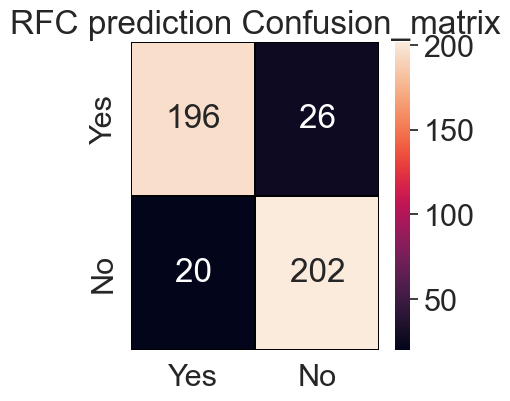

In [151]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(4,4))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

## Hyper parameter tuning for best model using GridsearchCV

In [152]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [153]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .30, random_state = 19)
rfc=RandomForestClassifier(random_state=19)
param={'max_features':['auto','sqrt','log2'],
      'max_depth':(10,20,50),
      'criterion':['gini','entropy']}
gss=GridSearchCV(rfc,param,cv=5)
gss.fit(x_train,y_train)
gss.best_params_

{'criterion': 'entropy', 'max_depth': 20, 'max_features': 'auto'}

In [154]:
final_model=RandomForestClassifier(random_state=19, max_features='auto', max_depth=20, criterion='entropy')
final_model.fit(x_train, y_train)
fmod_pred = final_model.predict(x_test)
fmod_acc = (accuracy_score(y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

Accuracy score for the Best Model is: 90.76576576576578


### after hyper parameter tuning , accuracy will reach to 90.76%

## ROC-AUC Curve

In [155]:
from sklearn.metrics import roc_curve, auc, roc_auc_score, r2_score, classification_report, mean_absolute_error, mean_squared_error

In [156]:
fpr, tpr, threshold = roc_curve(y_test,fmod_pred)
auc = roc_auc_score(y_test,fmod_pred)

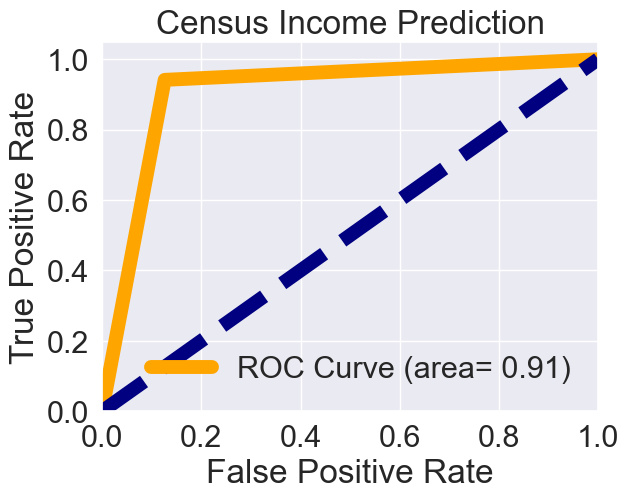

In [157]:
plt.figure()
plt.plot(fpr,tpr,color="orange",lw=10,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="navy",lw=10,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Census Income Prediction")
plt.legend(loc="lower right")
plt.show()

This is the AUC-ROC curve for the models which is plotted False positive rate against True positive rate. So the best model has the area under curve as 0.91

In general, an ROC-AUC of 0.5 suggests no discrimination , 0.7 to 0.8 is considered acceptable, 0.8 to 0.9 is considered excellent, and more than 0.9 is considered outstanding. now our curve is in excellent

In [158]:
x.head(3)

,months_as_customer,age,policy_state,policy_csl,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,1.143741,1.075225,1.356516,0.236775,0.647645,1.245682,0.638242,-1.144571,1.413487,-1.443060,1.043768,0.992417,0.929537,0.803868,-0.947094,1.35489,0.470922,-0.945963,-0.998483,-0.822169,0.055761,0.136328,0.595481,0.134018,0.979182,-1.753948,-0.196698,0.166775,1.129662,1.780507,1.285429,-1.184850
1,0.224814,0.379814,0.087462,0.236775,-0.264050,1.245682,0.638242,-0.095351,1.042111,-0.176317,-0.889834,0.992417,1.905220,1.783066,0.125361,1.35489,0.968754,1.130456,-0.538362,-0.822169,1.325385,-1.124702,-1.330884,1.389375,0.450570,-0.696186,0.337454,1.354583,-0.109471,0.631981,0.876940,-1.184850
2,-0.638977,-1.126911,1.356516,-1.065929,0.674732,-0.802773,1.727115,1.216173,-1.371833,0.457054,0.383514,0.992417,-1.021831,-0.175329,0.125361,1.35489,-1.022574,-0.945963,-0.691736,1.272168,-1.213864,1.397357,1.558664,-1.121340,-0.606653,1.034696,0.337454,-0.783472,-0.109471,-0.229414,0.979062,-0.038442


In [159]:
df.head(3)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month
0,328,48,2,1,1000,1406.91,0,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1,17,10,2014,25,1
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,6,15,2,0,0,3,3,1,4,5,5,8,1,2,0,0,2,5070,780,780,3510,8,12,2007,1,27,6,2006,21,1
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0,9,6,2000,22,2


### BULDING THE PREDICTION SYSTEM

In [162]:
input_data = (328,48,2,1,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,10,1,2004,17,10,2014,25,1)
input_data_array = np.asarray(input_data)

#reshaping the data so that it works for only one instance at a time
input_data_reshaped = input_data_array.reshape(1,-1)

prediction = final_model.predict(input_data_reshaped)
print("Predicted Fraud reported:",str(prediction))

Predicted Fraud reported: [0]


# Saving the trained model

In [163]:
# Saving the model using .pkl
import pickle
joblib.dump(final_model,"Insurance Claim Fraud Detection.pkl")

['Insurance Claim Fraud Detection.pkl']

In [164]:
hs= joblib.load(open('Insurance Claim Fraud Detection.pkl', 'rb'))
result = hs.score(x_test, y_test)*100
print(result)

90.76576576576578


In [165]:
import numpy as np
a=np.array(y_test)
predicted=np.array(final_model.predict(x_test))
df_com=pd.DataFrame({'original':a, 'predicted':predicted},index=range(len(a)))
df_com.head(20)

,original,predicted
0,1,1
1,0,0
2,1,1
3,0,0
4,1,1
5,1,1
6,1,1
7,1,1
8,0,0
9,0,0


#### the above results shows that 90.76% results were predicted accurately as per the model.

In [166]:
model =df_com.to_csv('Insurance Claim Fraud Detection.csv')
model

__Model Prediction saved in CSV format__

# thank you